In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import dandelion as ddl
sc.logging.print_versions()

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/NC_study/scanpy'))

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.5.1 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1


In [2]:
# Set up the sample info
sampleInfo = pd.read_csv('/home/jovyan/NC_study/sampleInfo.csv')
sampleInfo

,sampleid,age_group,patient,sampletype,gender,cohort
0,Sample_Fq1,Old,1,Blood,M,COVID
1,Sample_Fq2,Old,1,Nasal,M,COVID
2,Sample_Fq3,Middle,2,Blood,M,COVID
3,Sample_Fq4,Middle,2,Nasal,M,COVID
4,Sample_Fq5,Young,3,Nasal,F,COVID
5,Sample_Fq6,Young,3,Blood,F,COVID


In [3]:
# read it as a list
adata_list = []
# for i in range(0, len(sampleInfo['10x_ID'])):
for i in sampleInfo.index:            
    # import data
    inputfile='/home/jovyan/NC_study/raw/Trans/COVID/'+sampleInfo['sampleid'].at[i]+'/filtered_feature_bc_matrix.h5'
    adata = sc.read_10x_h5(inputfile, gex_only=True)
    adata.var_names_make_unique()
    adata.obs['sampleid'] = sampleInfo['sampleid'].at[i]
    adata.obs['patient'] = sampleInfo['patient'].at[i]    
    adata.obs['sampletype'] = sampleInfo['sampletype'].at[i]
    adata.obs['age_group'] = sampleInfo['age_group'].at[i]
    adata.obs['gender'] = sampleInfo['gender'].at[i]
    adata.obs['cohort'] = sampleInfo['cohort'].at[i]
    # rename cells to sample id + barcode, cleaving the trailing -1
    adata.obs_names = [str(sampleInfo['sampleid'].at[i])+'_'+str(j).split('-')[0] for j in adata.obs_names]
    adata.layers['counts'] = adata.X.copy()
    # using dandelion's qc recipe to mark doublets with scrublet and low quality cells based on standard metrics
    # default settings are max_genes=2500, min_genes=200, mito_cutoff=0.05, pval_cutoff=0.1, min_counts=None, max_counts=None
    ddl.pp.recipe_scanpy_qc(adata, mito_cutoff = 0.1)
    adata_list.append(adata)
adata = adata_list[0].concatenate(adata_list[1:], index_unique=None)
adata.obs['patient'] = adata.obs['patient'].astype('category')
adata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 29539 × 33538
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'
    layers: 'counts'

In [4]:
adata.obs

,sampleid,patient,sampletype,age_group,gender,cohort,scrublet_score,n_genes,percent_mito,n_counts,bh_pval,is_doublet,filter_rna,batch
Sample_Fq1_AAACCTGCAACGATCT,Sample_Fq1,1,Blood,Old,M,COVID,0.097852,695,0.041611,1490.0,0.891335,False,False,0
Sample_Fq1_AAACCTGCAATGACCT,Sample_Fq1,1,Blood,Old,M,COVID,0.104478,230,0.063444,331.0,0.730747,False,False,0
Sample_Fq1_AAACCTGGTATGGTTC,Sample_Fq1,1,Blood,Old,M,COVID,0.119565,205,0.026230,305.0,0.943311,False,False,0
Sample_Fq1_AAACCTGGTCAGCTAT,Sample_Fq1,1,Blood,Old,M,COVID,0.091743,243,0.056338,355.0,0.943311,False,False,0
Sample_Fq1_AAACGGGCAATTGCTG,Sample_Fq1,1,Blood,Old,M,COVID,0.173145,161,0.027132,258.0,0.561261,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sample_Fq6_TTTGTCAGTTAGTGGG,Sample_Fq6,3,Blood,Young,F,COVID,0.170877,791,0.126776,1830.0,0.788752,False,True,5
Sample_Fq6_TTTGTCATCACCGGGT,Sample_Fq6,3,Blood,Young,F,COVID,0.011894,552,0.049445,991.0,0.830486,False,False,5
Sample_Fq6_TTTGTCATCATGGTCA,Sample_Fq6,3,Blood,Young,F,COVID,0.070000,533,0.052423,1011.0,0.788752,False,False,5
Sample_Fq6_TTTGTCATCCACTGGG,Sample_Fq6,3,Blood,Young,F,COVID,0.564516,359,0.072056,569.0,0.788752,False,False,5


In [4]:
# How many doublets did scrublet pick up?
adata.obs['is_doublet'].value_counts()

False    28007
True      1532
Name: is_doublet, dtype: int64

In [5]:
# How many cells are `bad quality`
adata.obs['filter_rna'].value_counts()

False    24995
True      4544
Name: filter_rna, dtype: int64

In [6]:
# Remove the bad quality cells and continue
adata = adata[adata.obs['filter_rna'] != True]
adata

View of AnnData object with n_obs × n_vars = 24995 × 33538
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'
    layers: 'counts'

In [7]:
# check how many cells
pd.crosstab(adata.obs['sampletype'], adata.obs['patient'])

patient,1,2,3
sampletype,,,
Blood,1627,6397,8372
Nasal,2325,998,5276


In [8]:
# filter genes
sc.pp.filter_genes(adata, min_cells = 3)
# create a separate object to hold the raw counts
adata_raw = adata.copy()
# also do this
adata.layers["counts"] = adata.X.copy()
adata_raw.layers["counts"] = adata_raw.X.copy()

Trying to set attribute `.var` of view, copying.


... storing 'sampleid' as categorical
... storing 'sampletype' as categorical
... storing 'age_group' as categorical
... storing 'gender' as categorical
... storing 'cohort' as categorical
... storing 'is_doublet' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


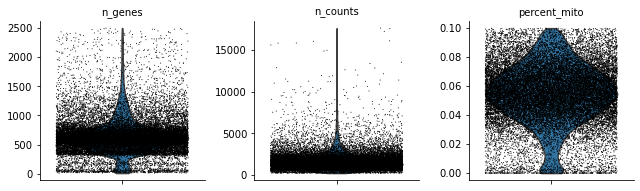

In [9]:
# violin plot of the computed quality measures.
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'], jitter = 0.4, multi_panel = True)

In [10]:
# normalize to 10000 counts per cell
sc.pp.normalize_total(adata, target_sum = 1e4)
sc.pp.log1p(adata)
# stash the normalized data in raw
adata.raw = adata
adata

AnnData object with n_obs × n_vars = 24995 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'log1p'
    layers: 'counts'

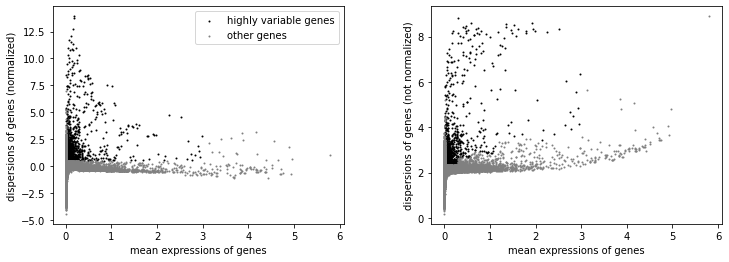

In [11]:
# Identify highly-variable genes
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# plot highly_variable_genes
sc.pl.highly_variable_genes(adata)

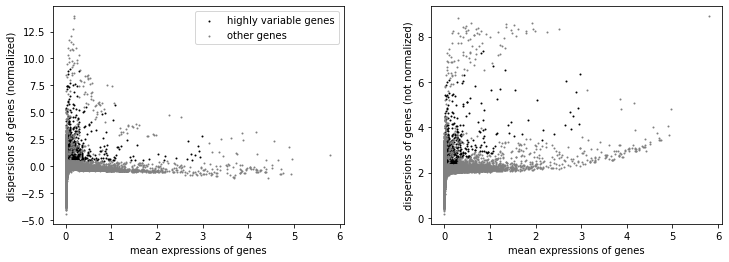

In [12]:
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in adata.var.index:
    if re.search('^TR[AB]V|^IG[HKL]V', i):
        adata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata)

In [13]:
# filter to only highly variable
adata = adata[:, adata.var['highly_variable']]
adata

View of AnnData object with n_obs × n_vars = 24995 × 1143
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p'
    layers: 'counts'

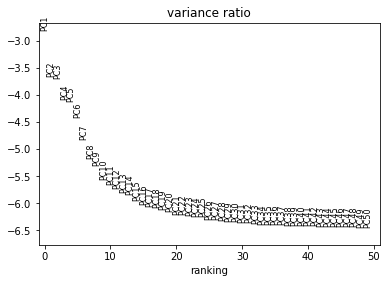

In [14]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'], n_jobs = multiprocessing.cpu_count()-4)
sc.pp.scale(adata, max_value = 10)
# Principal component analysis
sc.tl.pca(adata, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)

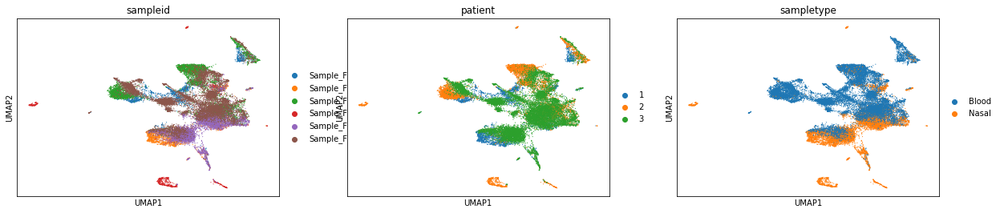

In [15]:
# Computing the neighborhood graph. Seurat uses k = 20 as default
sc.pp.neighbors(adata, n_neighbors = 10, n_pcs = 50)
# run UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.3)
sc.pl.umap(adata, color=['sampleid', 'patient', 'sampletype'])

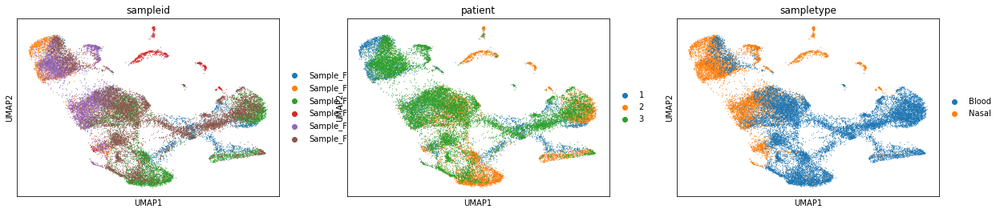

In [16]:
# run BBKNN
sc.external.pp.bbknn(adata, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.3)
sc.pl.umap(adata, color=['sampleid', 'patient', 'sampletype'])

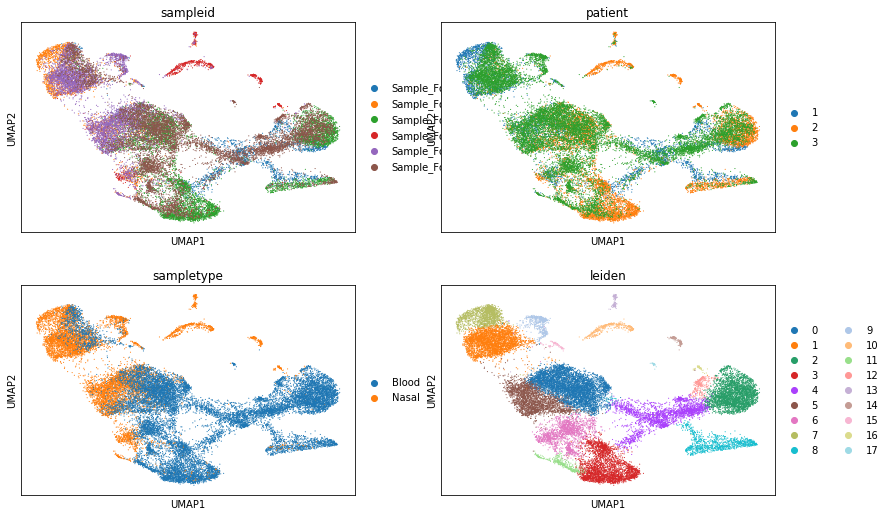

In [17]:
# find clusters
sc.tl.leiden(adata)
sc.pl.umap(adata, color=['sampleid', 'patient', 'sampletype', 'leiden'], ncols = 2)

In [18]:
# create a palette for umap
import sys
sys.path.append('/home/jovyan/NC_study/scanpy/scripts')
from tools import cmp
newcmp = cmp()

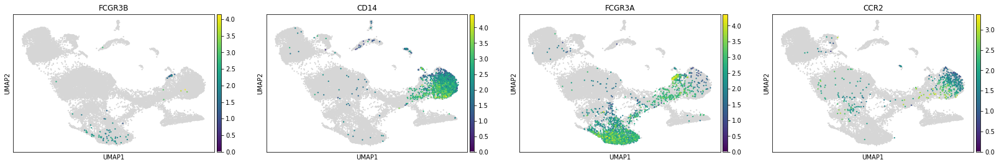

In [19]:
sc.pl.umap(adata, color = ['FCGR3B', 'CD14', 'FCGR3A', 'CCR2'], color_map = newcmp, size = 20)

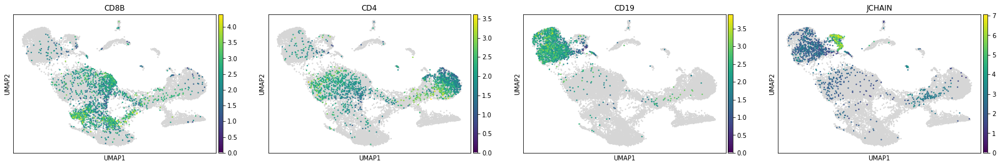

In [20]:
sc.pl.umap(adata, color = ['CD8B', 'CD4', 'CD19', 'JCHAIN'], color_map = newcmp, size = 20)

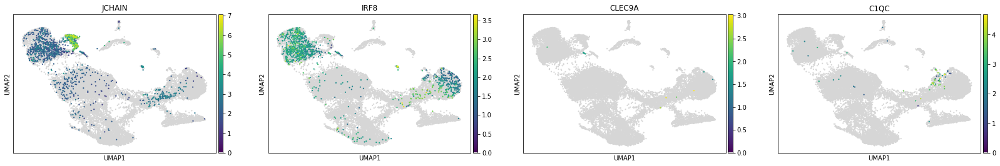

In [21]:
sc.pl.umap(adata, color = ['JCHAIN', 'IRF8', 'CLEC9A', 'C1QC'], color_map = newcmp, size = 20)

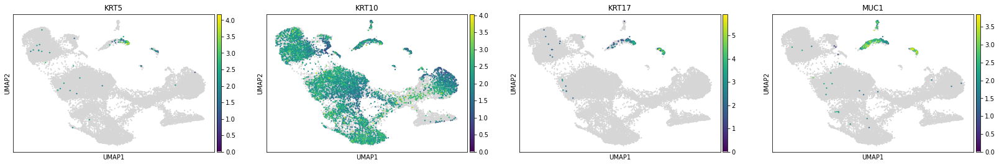

In [22]:
sc.pl.umap(adata, color = ['KRT5', 'KRT10', 'KRT17', 'MUC1'], color_map = newcmp, size = 20)

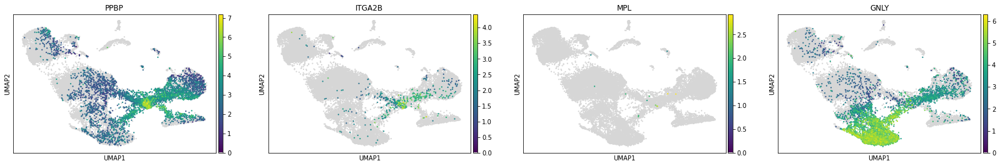

In [23]:
sc.pl.umap(adata, color = ['PPBP', 'ITGA2B', 'MPL', 'GNLY'], color_map = newcmp, size = 20)

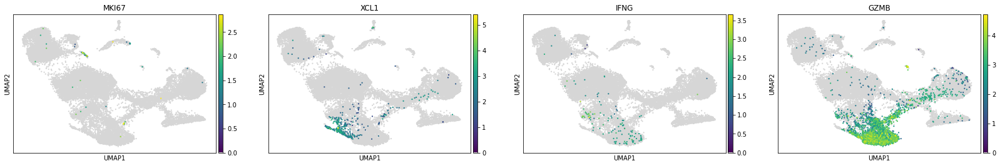

In [24]:
sc.pl.umap(adata, color = ['MKI67', 'XCL1', 'IFNG', 'GZMB'], color_map = newcmp, size = 20)

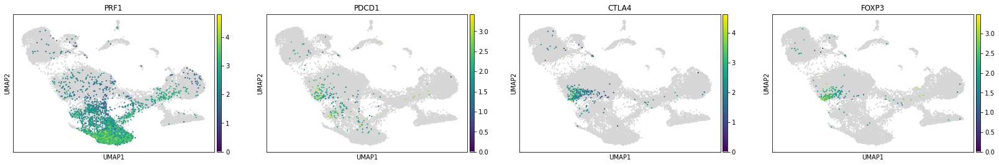

In [25]:
sc.pl.umap(adata, color = ['PRF1', 'PDCD1', 'CTLA4', 'FOXP3'], color_map = newcmp, size = 20)

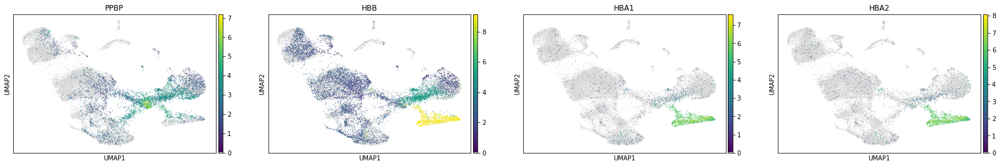

In [26]:
sc.pl.umap(adata, color = ['PPBP', 'HBB', 'HBA1', 'HBA2'], color_map = newcmp)

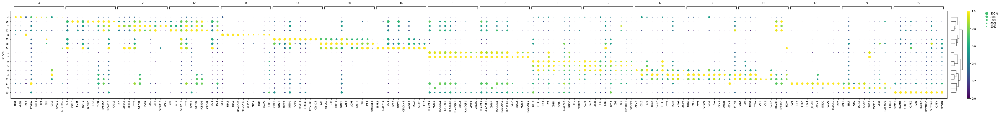

In [27]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(adata, min_fold_change=1)
sc.tl.dendrogram(adata, groupby = 'leiden')
sc.pl.rank_genes_groups_dotplot(adata, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

### Check cluster positions again

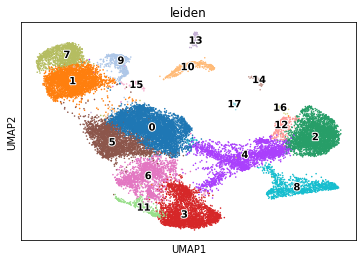

In [28]:
sc.pl.umap(adata, color = ['leiden'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

## Sub-clustering for fine cell type annotation

First create a new column called `leiden_R_label` which I will update as I progress through.

In [29]:
adata.obs['fine_label'] = adata.obs['leiden']

### Megakaryocytes

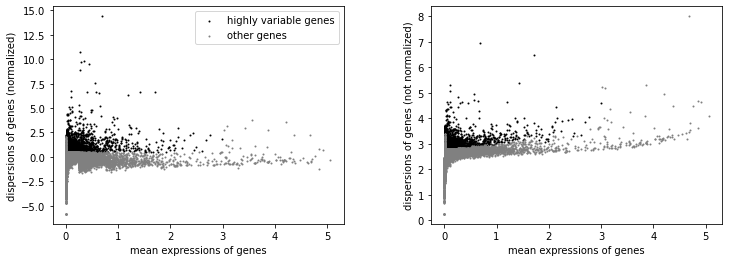

AnnData object with n_obs × n_vars = 2385 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'rank_genes_groups_filtered', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [30]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['4'])]
rna_x = sc.AnnData(X = rna_.raw.X, obs = rna_.obs, var = rna_.raw.var, uns = rna_.uns, obsm = rna_.obsm, obsp = rna_.obsp)
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [31]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

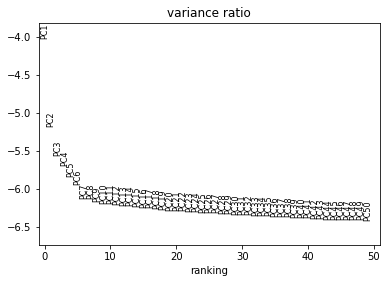

In [32]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

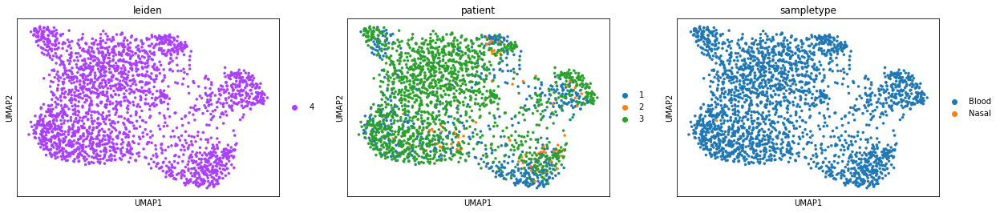

In [33]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'], size=50)

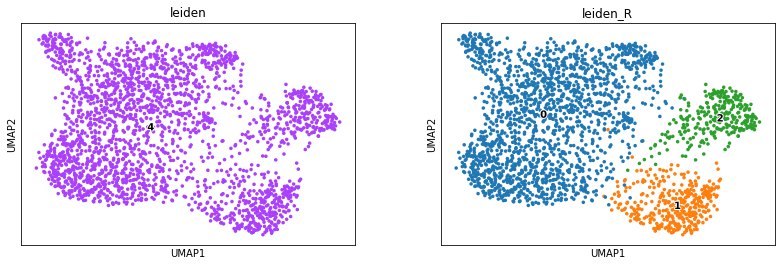

In [34]:
# find clusters
sc.tl.leiden(rna_x, resolution = .3, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

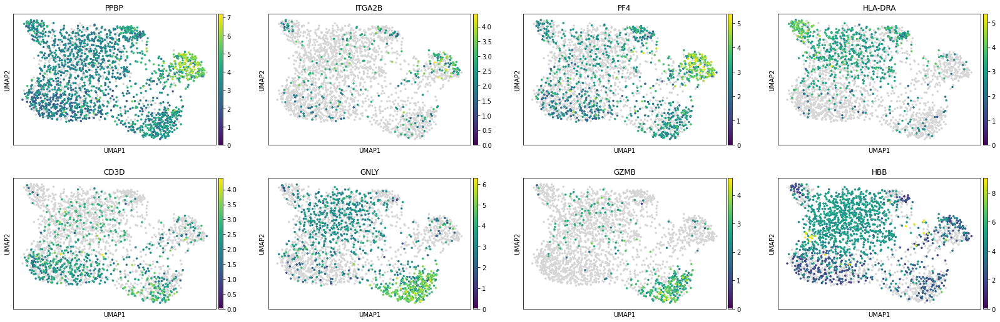

In [35]:
sc.pl.umap(rna_x, color = ['PPBP', 'ITGA2B', 'PF4', 'HLA-DRA', 'CD3D', 'GNLY', 'GZMB', 'HBB'], color_map = newcmp)

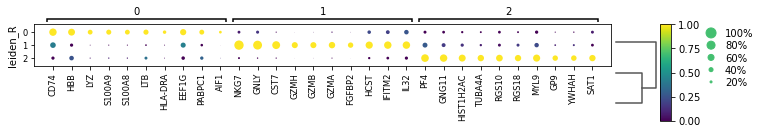

In [36]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'fine_label' as categorical


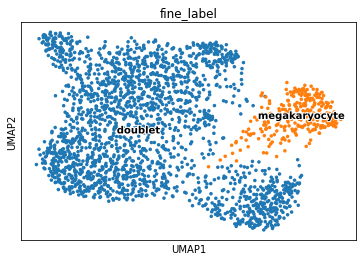

In [37]:
new_dict1 = {'0':'doublet', '1':'doublet', '2':'megakaryocyte'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['fine_label'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical


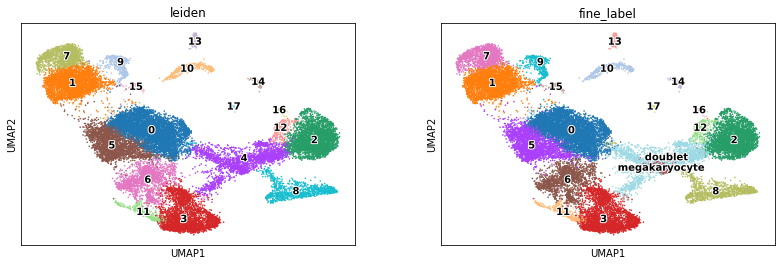

In [38]:
# update the original object
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
adata.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### Erythrocyte

Will just update cluster 8 to be called erythrocytes.

Trying to set attribute `.obs` of view, copying.
... storing 'fine_label' as categorical


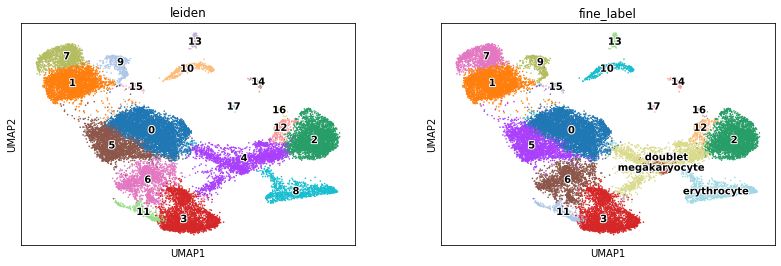

In [39]:
# subset
rna_x = adata[adata.obs['leiden'].isin(['8'])]
new_dict1 = {'8':'erythrocyte'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden']]
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
adata.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### Monocyte/Macrophage

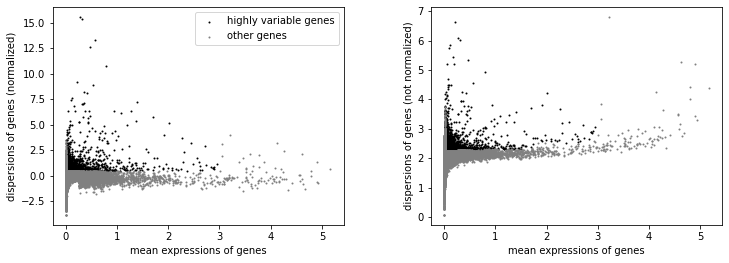

AnnData object with n_obs × n_vars = 3425 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'rank_genes_groups_filtered', 'dendrogram_leiden', 'fine_label_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [40]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['2','12','16'])]
rna_x = sc.AnnData(X = rna_.raw.X, obs = rna_.obs, var = rna_.raw.var, uns = rna_.uns, obsm = rna_.obsm, obsp = rna_.obsp)
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [41]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

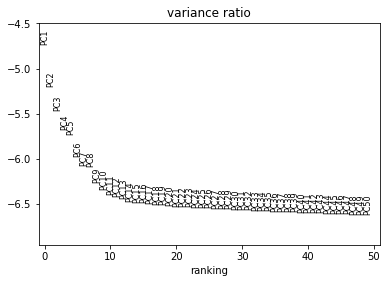

In [42]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

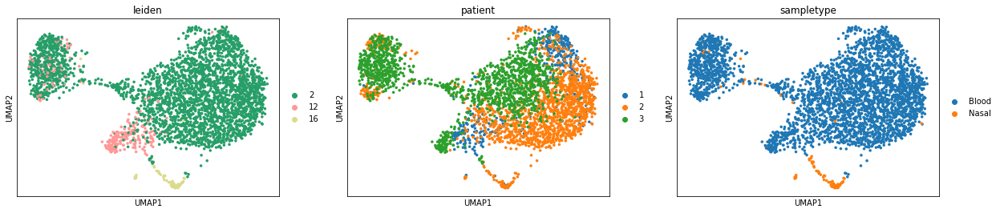

In [43]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'], size=50)

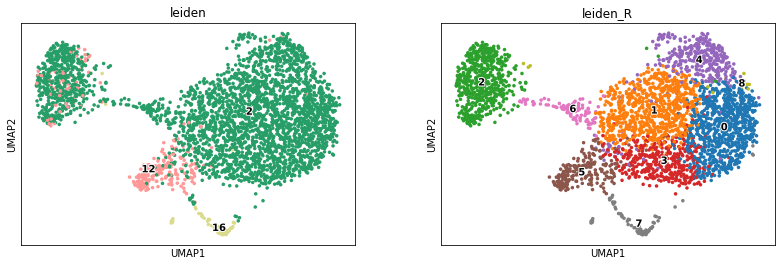

In [44]:
# find clusters
sc.tl.leiden(rna_x, resolution = 1, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

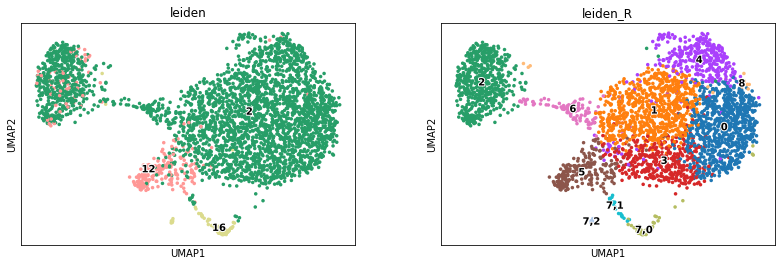

In [45]:
sc.tl.leiden(rna_x, resolution = .3, restrict_to = ('leiden_R', ['7']), key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

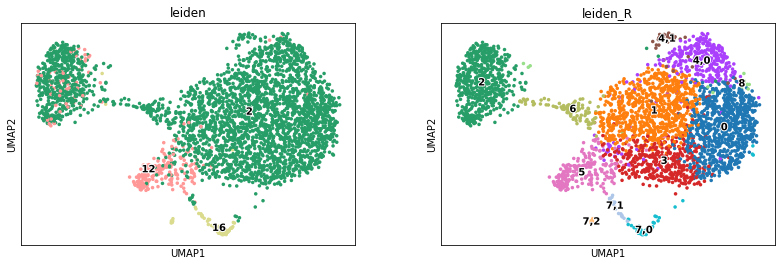

In [46]:
sc.tl.leiden(rna_x, resolution = .3, restrict_to = ('leiden_R', ['4']), key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

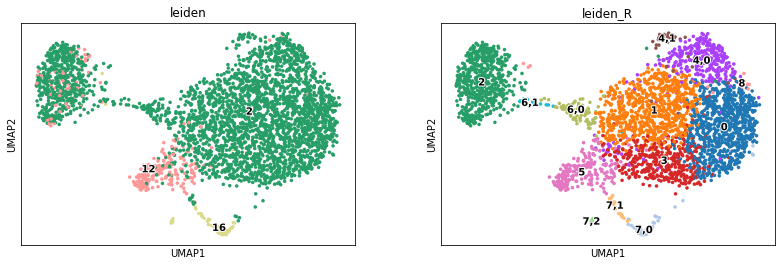

In [47]:
sc.tl.leiden(rna_x, resolution = .3, restrict_to = ('leiden_R', ['6']), key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

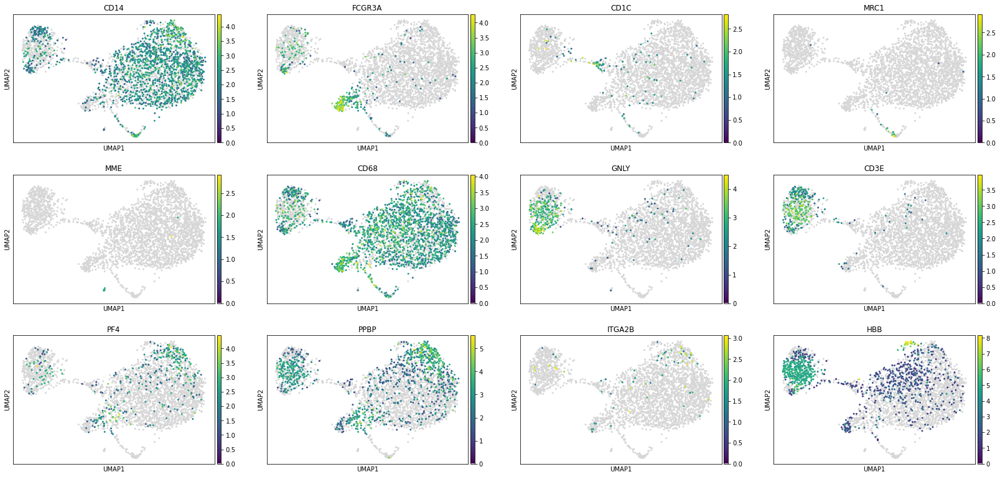

In [48]:
sc.pl.umap(rna_x, color = ['CD14', 'FCGR3A', 'CD1C', 'MRC1', 'MME', 'CD68', 'GNLY', 'CD3E', 'PF4', 'PPBP', 'ITGA2B', 'HBB'], color_map = newcmp)

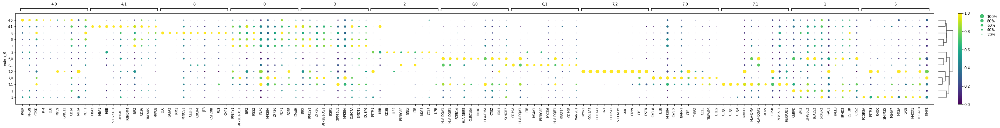

In [49]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

In [50]:
new_dict1 = {'0':'classical_monocyte',
'1':'classical_monocyte',
'2':'doublet',
'3':'classical_monocyte',
'4,0':'classical_monocyte',
'4,1':'doublet',
'5':'non_classical_monocyte',
'6,0':'DC',
'6,1':'doublet',
'7,0':'macrophage',
'7,1':'macrophage',
'7,2':'neutrophil',
'8':'classical_monocyte'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
# sc.pl.umap(rna_x, color=['leiden', 'leiden_R_label'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical


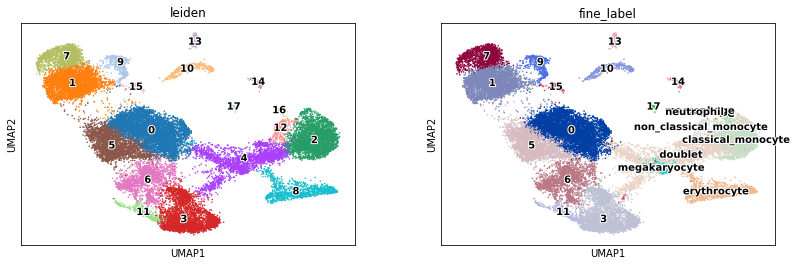

In [51]:
# update the original object
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
adata.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### NK cell/T cell

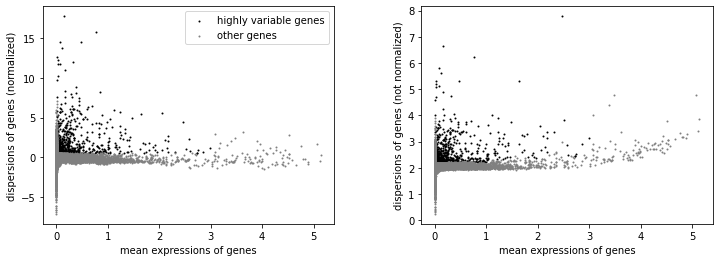

AnnData object with n_obs × n_vars = 12233 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'rank_genes_groups_filtered', 'dendrogram_leiden', 'fine_label_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [52]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['0','3','5','6','11'])]
rna_x = sc.AnnData(X = rna_.raw.X, obs = rna_.obs, var = rna_.raw.var, uns = rna_.uns, obsm = rna_.obsm, obsp = rna_.obsp)
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

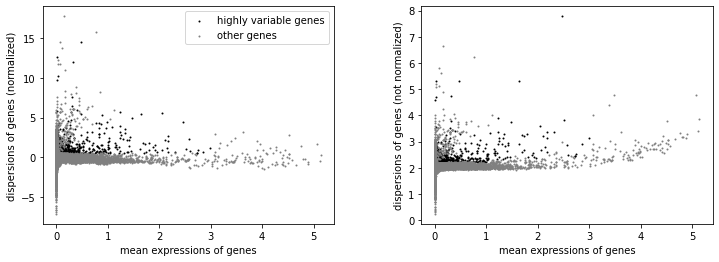

In [53]:
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
## allow for TRGV and TRDV so that i can do fine labelling for them
import re
for i in rna_x.var.index:
    if re.search('^TR[AB]V|^IG[HKL]V', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)

In [54]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

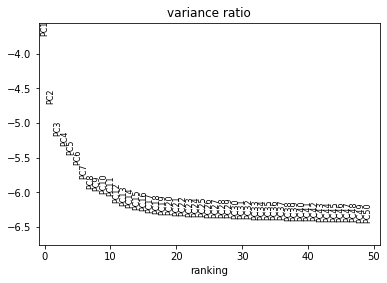

In [55]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

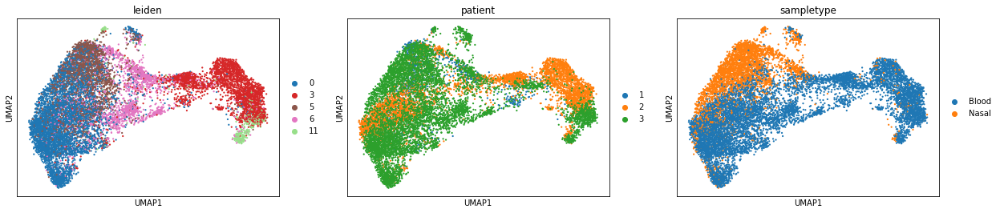

In [56]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'], size=20)

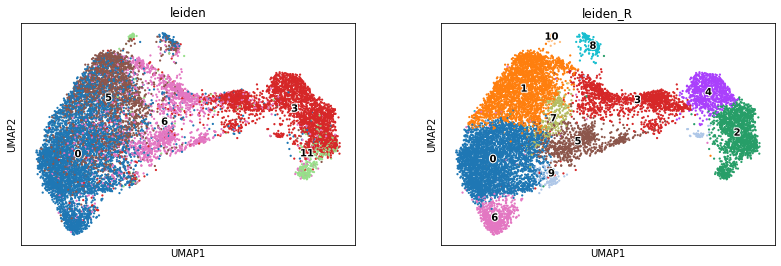

In [57]:
# find clusters
sc.tl.leiden(rna_x, resolution = .8, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=20, legend_loc ='on data', legend_fontoutline=2)

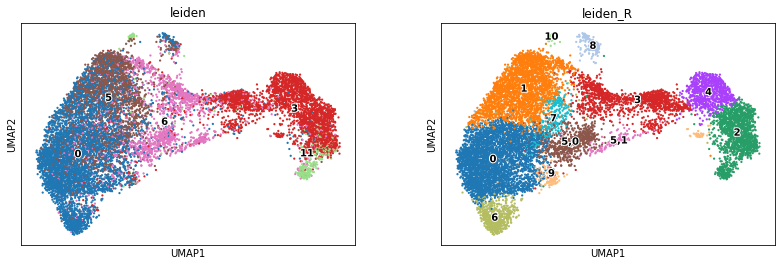

In [58]:
# find clusters
sc.tl.leiden(rna_x, resolution = .3, restrict_to =('leiden_R', ['5']), key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=20, legend_loc ='on data', legend_fontoutline=2)

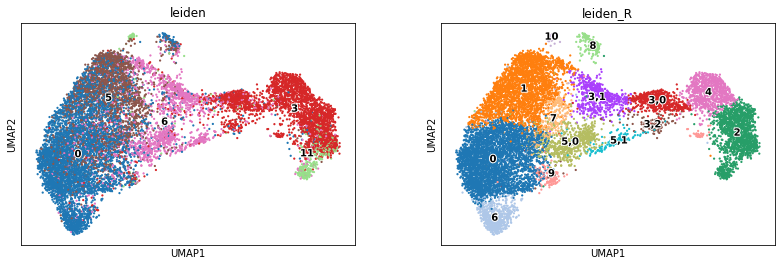

In [59]:
sc.tl.leiden(rna_x, resolution = .5, restrict_to =('leiden_R', ['3']), key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=20, legend_loc ='on data', legend_fontoutline=2)

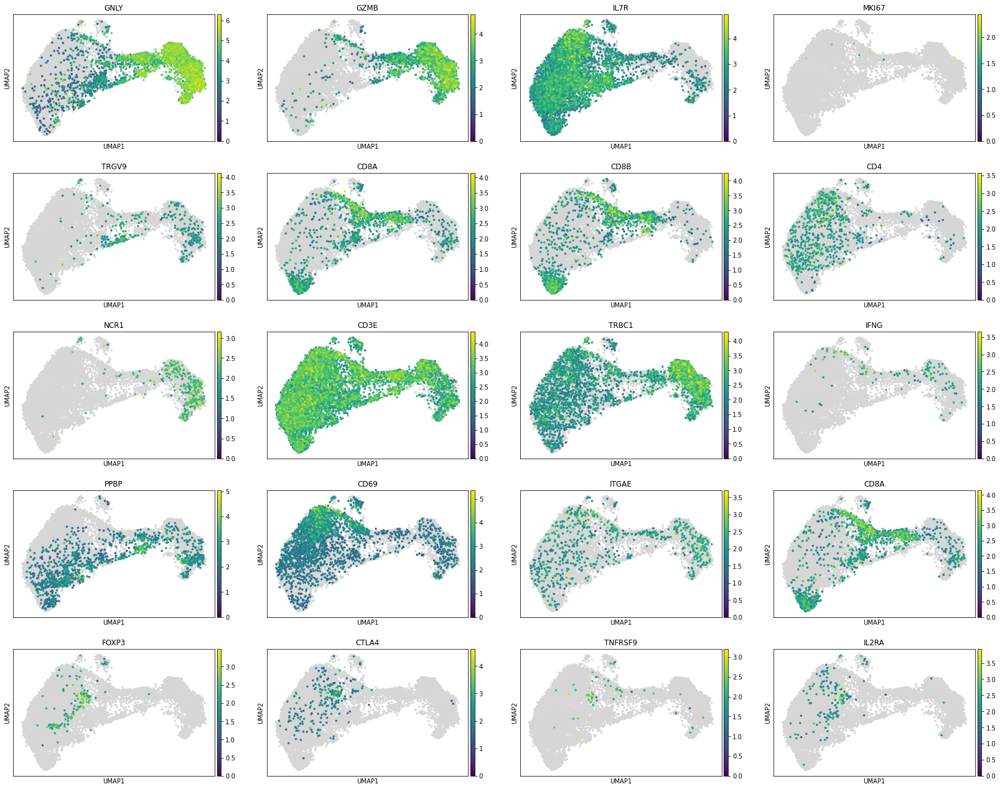

In [60]:
sc.pl.umap(rna_x, color = ['GNLY', 'GZMB', 'IL7R', 'MKI67', 'TRGV9', 'CD8A', 'CD8B', 'CD4', 'NCR1', 'CD3E', 'TRBC1', 'IFNG','PPBP', 'CD69', 'ITGAE', 'CD8A', 'FOXP3', 'CTLA4', 'TNFRSF9', 'IL2RA'], color_map = newcmp, size = 50)

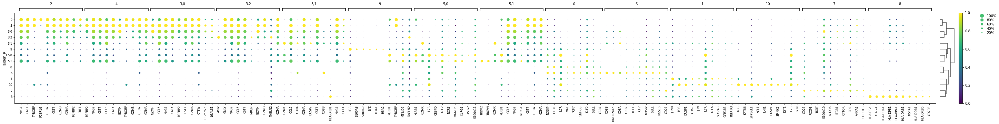

In [61]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'fine_label' as categorical


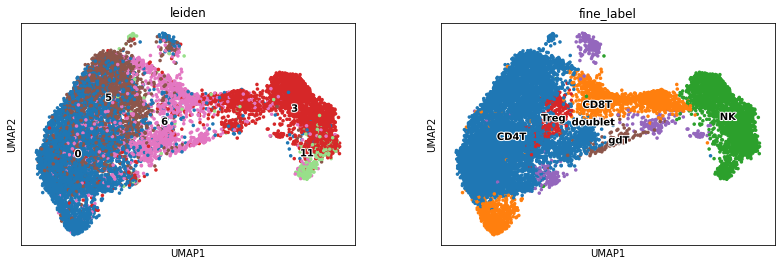

In [62]:
new_dict1 = {'0':'CD4T',
'1':'CD4T',
'2':'NK',
'3,0':'CD8T',
'3,1':'CD8T',
'3,2':'doublet',
'4':'NK',
'5,0':'CD4T',
'5,1':'gdT',
'6':'CD8T',
'7':'Treg',
'8':'doublet',
'9':'doublet',
'10':'CD4T'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical


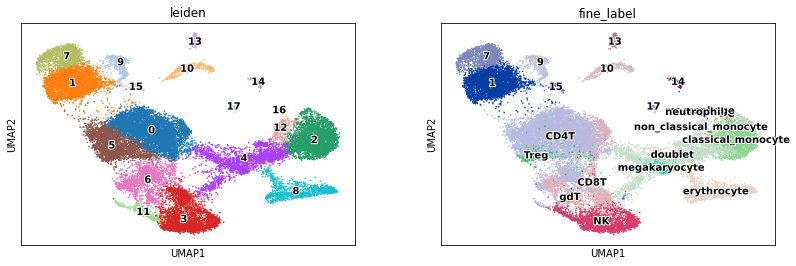

In [63]:
# update the original object
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
adata.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### pDC

Will just update cluster 18 to be called pDC.

Trying to set attribute `.obs` of view, copying.
... storing 'fine_label' as categorical


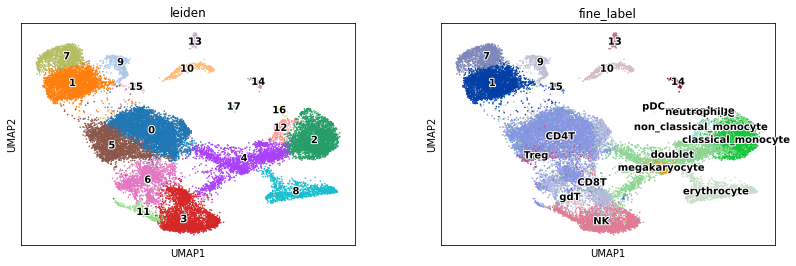

In [64]:
# subset
rna_x = adata[adata.obs['leiden'].isin(['17'])]
new_dict1 = {'17':'pDC'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden']]
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
adata.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### B cells

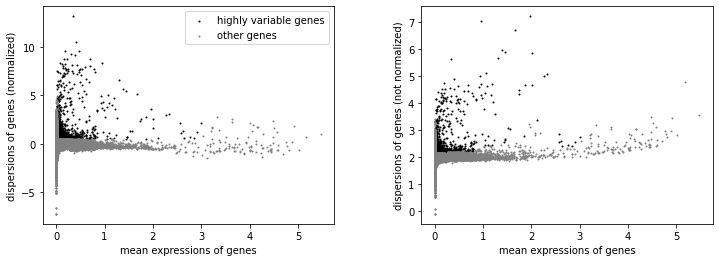

AnnData object with n_obs × n_vars = 4608 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'rank_genes_groups_filtered', 'dendrogram_leiden', 'fine_label_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [65]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['1', '7'])]
rna_x = sc.AnnData(X = rna_.raw.X, obs = rna_.obs, var = rna_.raw.var, uns = rna_.uns, obsm = rna_.obsm, obsp = rna_.obsp)
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

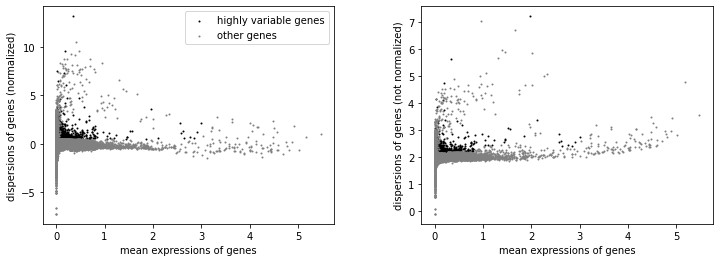

In [66]:
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rna_x.var.index:
    if re.search('^TR[AB]V|^IG[HKL]V', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)

In [67]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

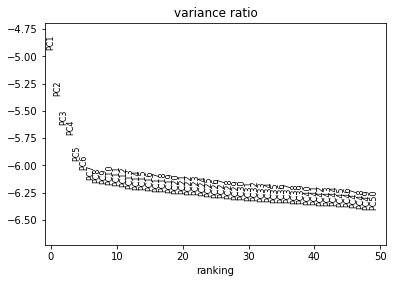

In [68]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

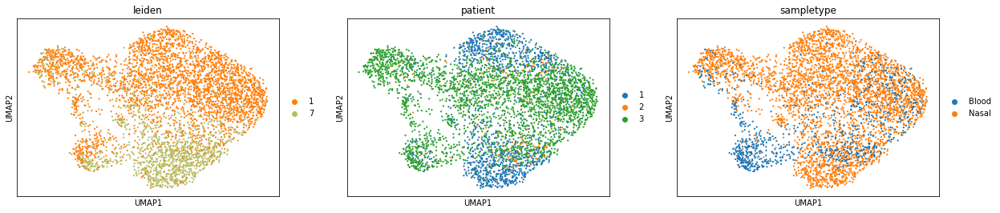

In [69]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'], size=20)

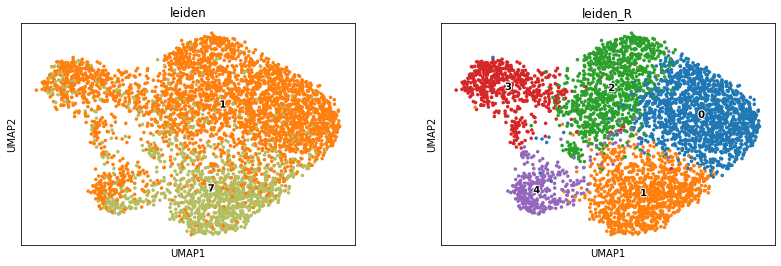

In [70]:
# find clusters
sc.tl.leiden(rna_x, resolution = .5, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

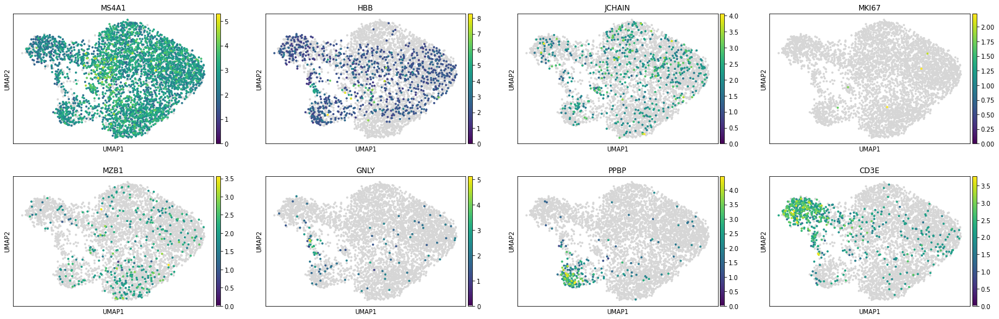

In [71]:
sc.pl.umap(rna_x, color = ['MS4A1', 'HBB', 'JCHAIN', 'MKI67', 'MZB1', 'GNLY', 'PPBP', 'CD3E'], color_map = newcmp, size = 50)

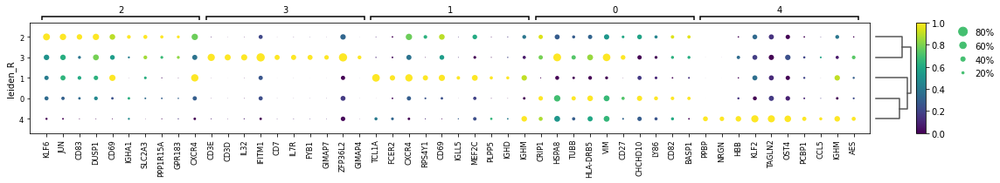

In [72]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'fine_label' as categorical


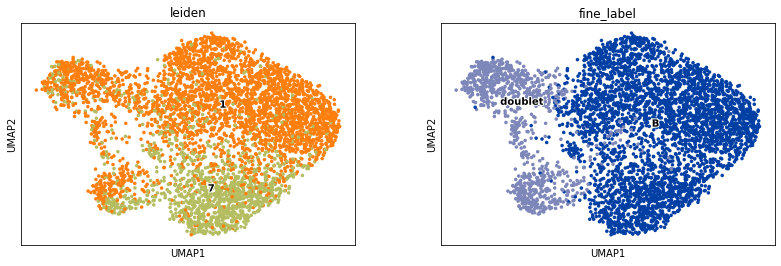

In [73]:
new_dict1 = {'0':'B',
             '1':'B',
             '2':'B',
             '3':'doublet',
             '4':'doublet'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical


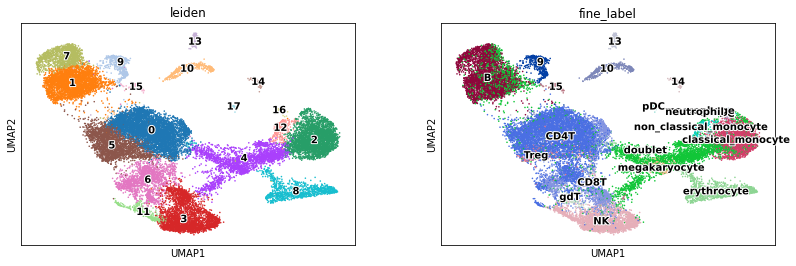

In [74]:
# update the original object
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
adata.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### Plasma cells

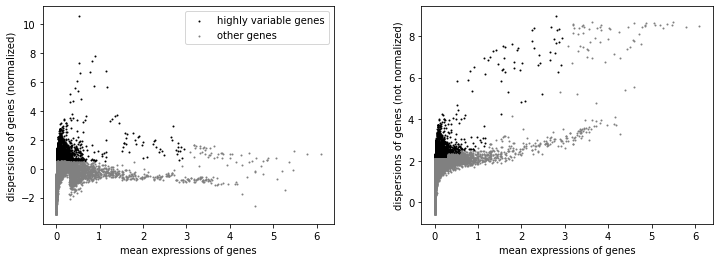

AnnData object with n_obs × n_vars = 502 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'rank_genes_groups_filtered', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [75]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['9'])]
rna_x = sc.AnnData(X = rna_.raw.X, obs = rna_.obs, var = rna_.raw.var, uns = rna_.uns, obsm = rna_.obsm, obsp = rna_.obsp)
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

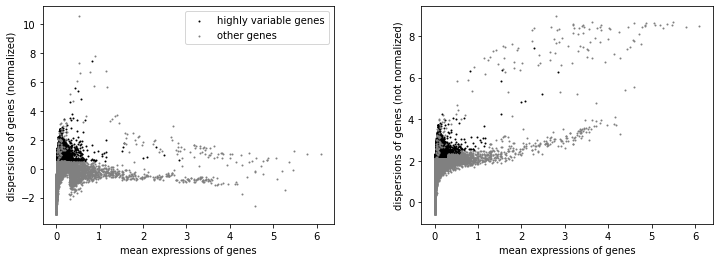

In [76]:
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rna_x.var.index:
    if re.search('^TR[AB]V|^IG[HKL]V', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)

In [77]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

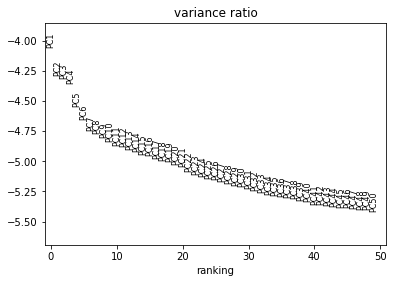

In [78]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

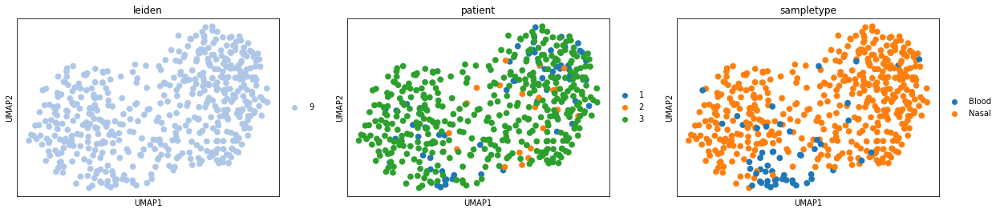

In [79]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'])

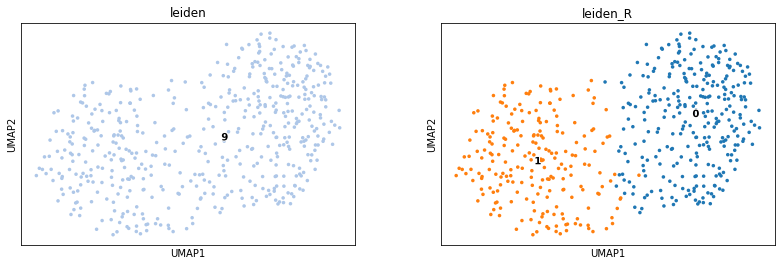

In [80]:
# find clusters
sc.tl.leiden(rna_x, resolution = .5, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

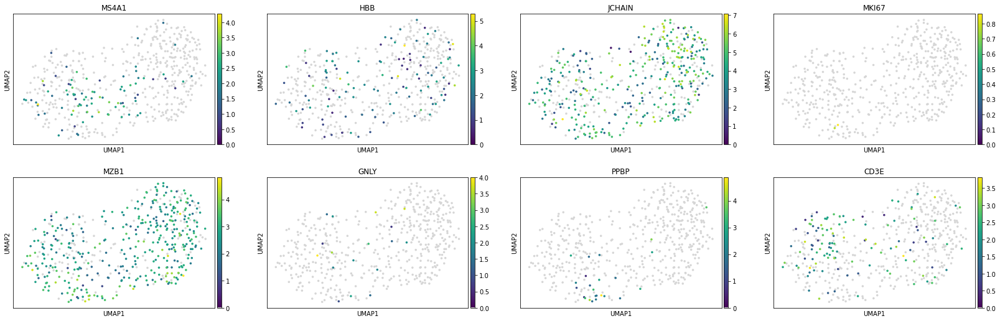

In [81]:
sc.pl.umap(rna_x, color = ['MS4A1', 'HBB', 'JCHAIN', 'MKI67', 'MZB1', 'GNLY', 'PPBP', 'CD3E'], color_map = newcmp, size = 50)

... storing 'fine_label' as categorical


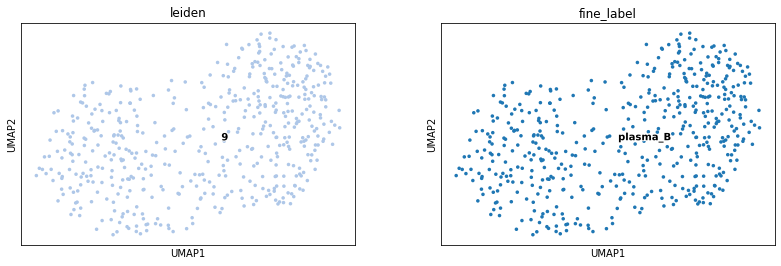

In [82]:
new_dict1 = {'0':'plasma_B',
             '1':'plasma_B'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical


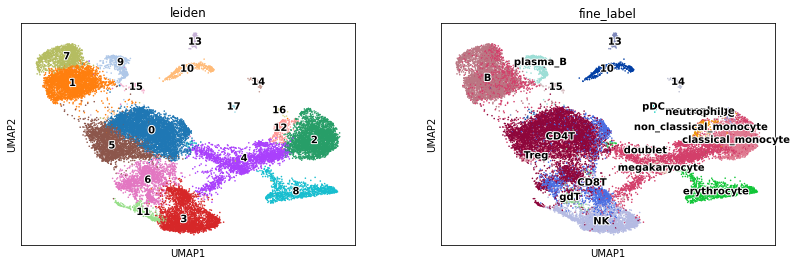

In [83]:
# update the original object
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
adata.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### Proliferating cells

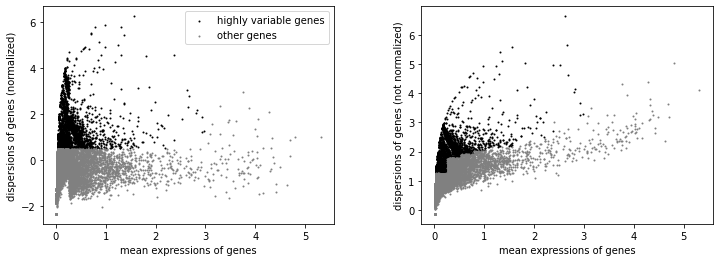

AnnData object with n_obs × n_vars = 94 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'rank_genes_groups_filtered', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [84]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['15'])]
rna_x = sc.AnnData(X = rna_.raw.X, obs = rna_.obs, var = rna_.raw.var, uns = rna_.uns, obsm = rna_.obsm, obsp = rna_.obsp)
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [85]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

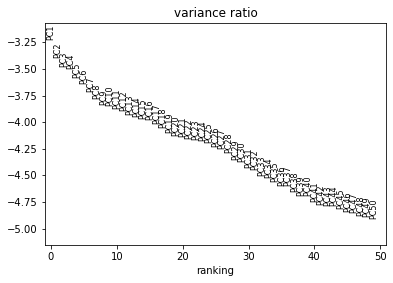

In [86]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

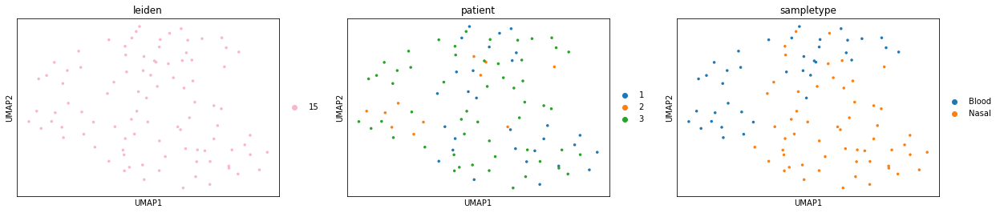

In [87]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'], size=50)

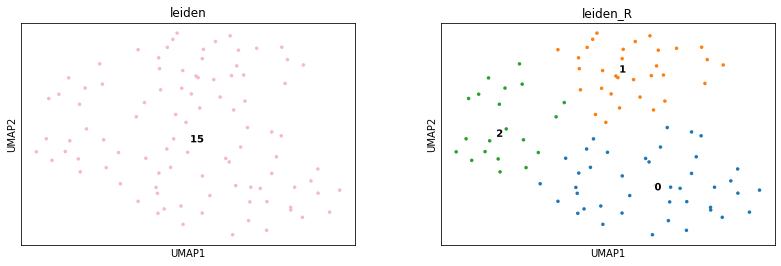

In [88]:
# find clusters
sc.tl.leiden(rna_x, resolution = .5, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

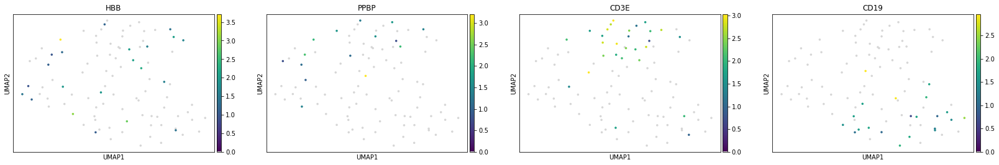

In [89]:
sc.pl.umap(rna_x, color = ['HBB', 'PPBP', 'CD3E', 'CD19'], color_map = newcmp, size = 50)

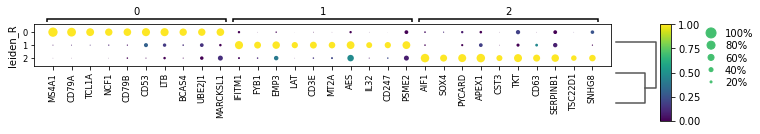

In [90]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'fine_label' as categorical


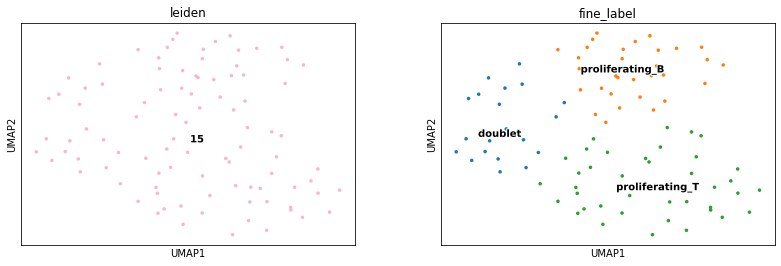

In [91]:
new_dict1 = {'0':'proliferating_T', '1':'proliferating_B', '2':'doublet'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical


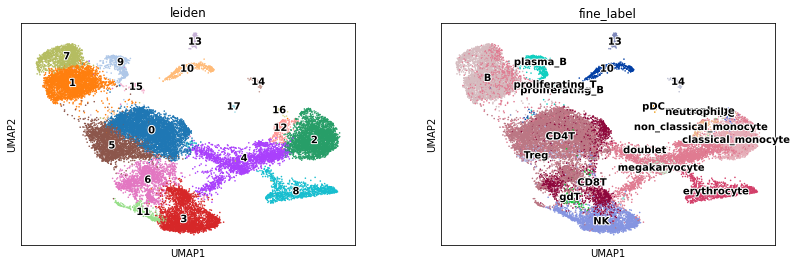

In [92]:
# update the original object
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
adata.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### Others

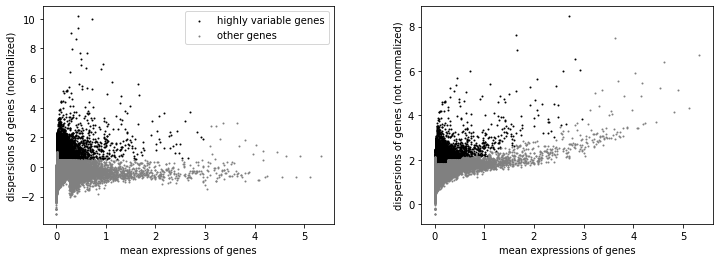

AnnData object with n_obs × n_vars = 662 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'rank_genes_groups_filtered', 'dendrogram_leiden', 'fine_label_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [93]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['10','13', '14'])]
rna_x = sc.AnnData(X = rna_.raw.X, obs = rna_.obs, var = rna_.raw.var, uns = rna_.uns, obsm = rna_.obsm, obsp = rna_.obsp)
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

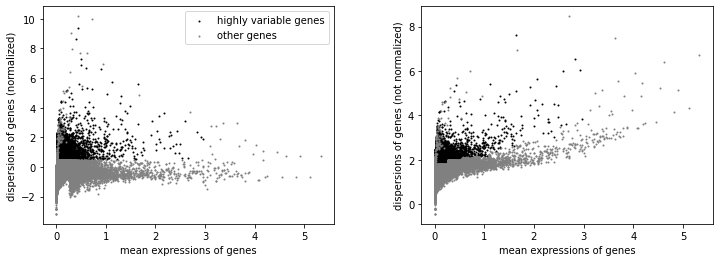

In [94]:
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rna_x.var.index:
    if re.search('^TR[AB]V|^IG[HKL]V', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)

In [95]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

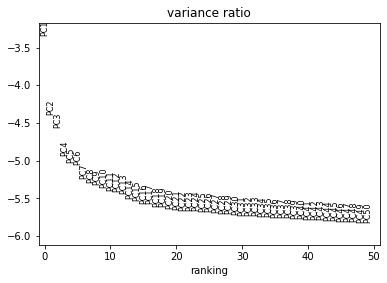

In [96]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

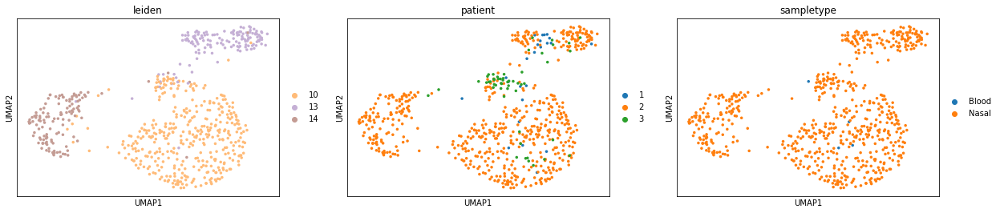

In [97]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'], size=50)

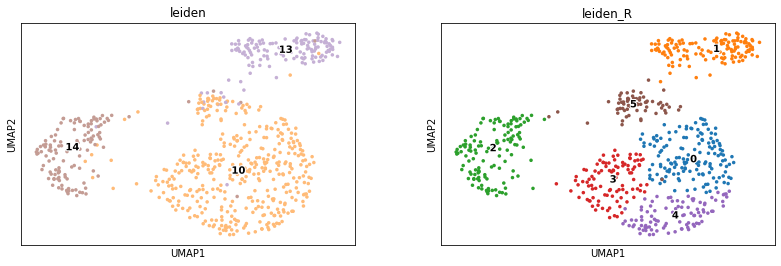

In [98]:
# find clusters
sc.tl.leiden(rna_x, resolution = .6, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

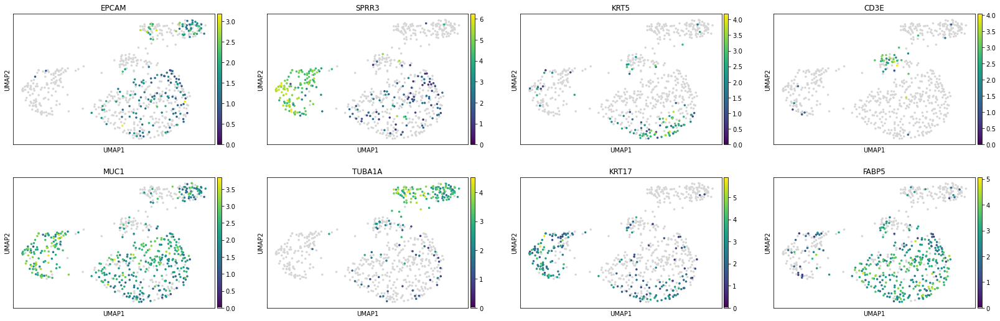

In [99]:
sc.pl.umap(rna_x, color = ['EPCAM', 'SPRR3', 'KRT5', 'CD3E', 'MUC1', 'TUBA1A', 'KRT17', 'FABP5'], color_map = newcmp, size = 50)

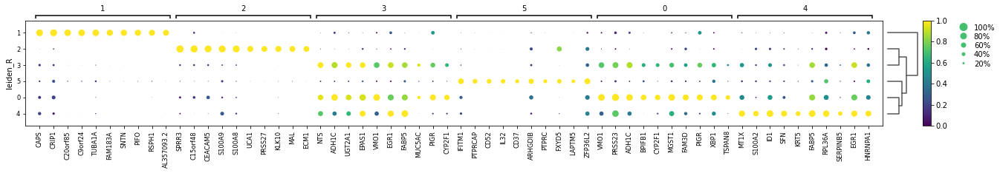

In [100]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'fine_label' as categorical


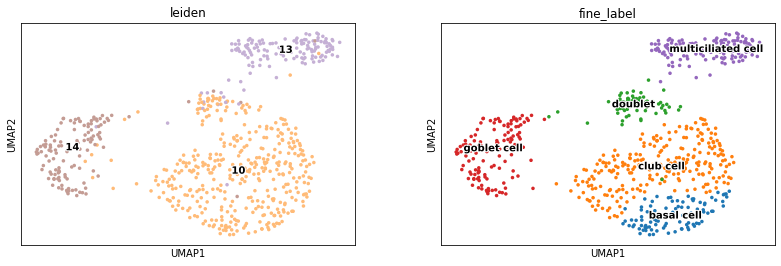

In [101]:
new_dict1 = {'0':'club cell', '1':'multiciliated cell', '2':'goblet cell', '3':'club cell', '4':'basal cell', '5':'doublet'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical


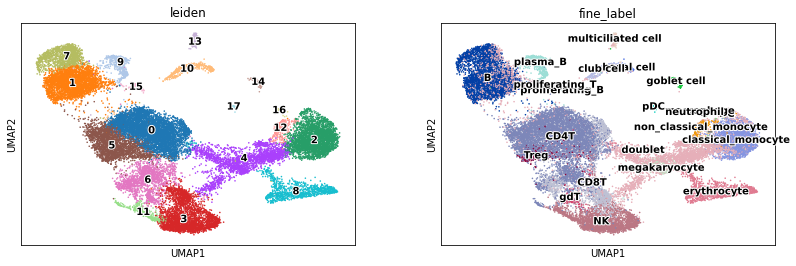

In [102]:
# update the original object
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
adata.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

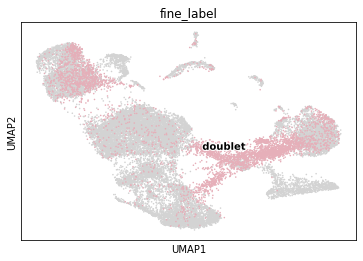

In [103]:
sc.pl.umap(adata, color = ['fine_label'], groups = 'doublet', size = 10, legend_loc = 'on data', legend_fontoutline=2)

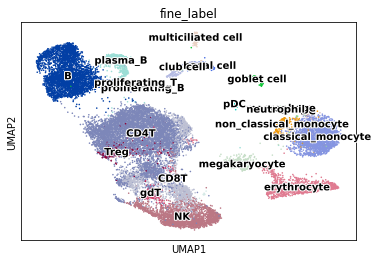

In [104]:
sc.pl.umap(adata[~(adata.obs['fine_label'] == 'doublet')], color = ['fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

In [105]:
adata

AnnData object with n_obs × n_vars = 24995 × 1143
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'rank_genes_groups_filtered', 'dendrogram_leiden', 'fine_label_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [106]:
adata_raw

AnnData object with n_obs × n_vars = 24995 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    layers: 'counts'

In [107]:
# transfer the slots in raw object
adata_raw.obs = adata.obs.copy()
adata_raw.obsm.update(adata.obsm)

In [108]:
# remove the doublets
adata = adata[~(adata.obs['fine_label'] == 'doublet')]
adata_raw = adata_raw[~(adata_raw.obs['fine_label'] == 'doublet')]
adata

View of AnnData object with n_obs × n_vars = 20732 × 1143
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'rank_genes_groups_filtered', 'dendrogram_leiden', 'fine_label_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

### Re-cluster the object without doublets

In [109]:
# recluster
adata2 = sc.AnnData(X = adata.raw.X, var = adata.raw.var, obs = adata.obs, raw = adata.raw)
adata2

AnnData object with n_obs × n_vars = 20732 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'

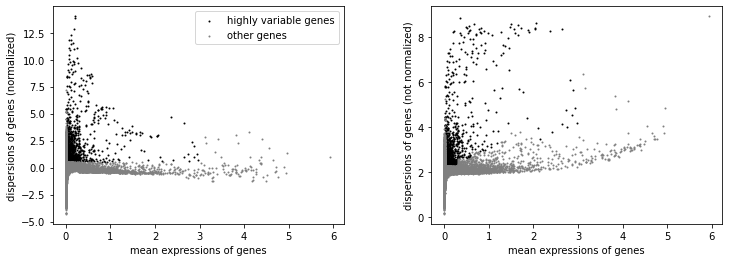

In [110]:
# Identify highly-variable genes
sc.pp.highly_variable_genes(adata2, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# plot highly_variable_genes
sc.pl.highly_variable_genes(adata2)

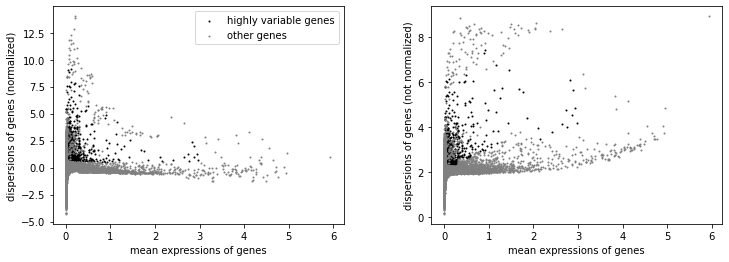

In [111]:
## remove TRBV/TRAV/TRDV/TRGV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in adata2.var.index:
    if re.search('^TR[AB]V|^IG[HKL]V', i):
        adata2.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata2)

In [112]:
# filter to only highly variable
adata2 = adata2[:, adata2.var['highly_variable']]
adata2

View of AnnData object with n_obs × n_vars = 20732 × 1179
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'

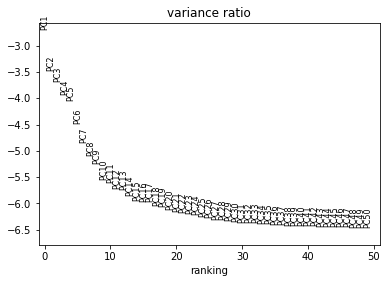

In [113]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(adata2, ['n_counts', 'percent_mito'], n_jobs = multiprocessing.cpu_count()-4)
sc.pp.scale(adata2, max_value = 10)
# Principal component analysis
sc.tl.pca(adata2, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata2, log = True, n_pcs = 50)

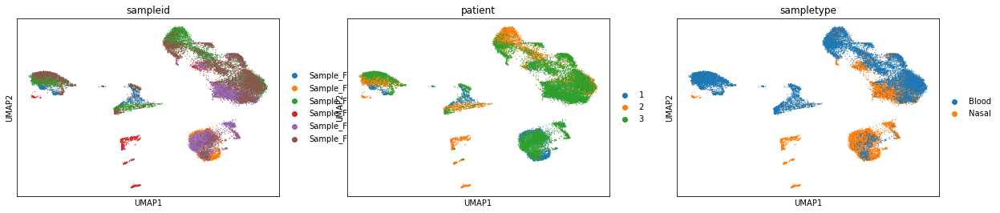

In [114]:
# run BBKNN
sc.external.pp.bbknn(adata2, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(adata2, n_components = 2, min_dist = 0.3)
sc.pl.umap(adata2, color=['sampleid', 'patient', 'sampletype'])

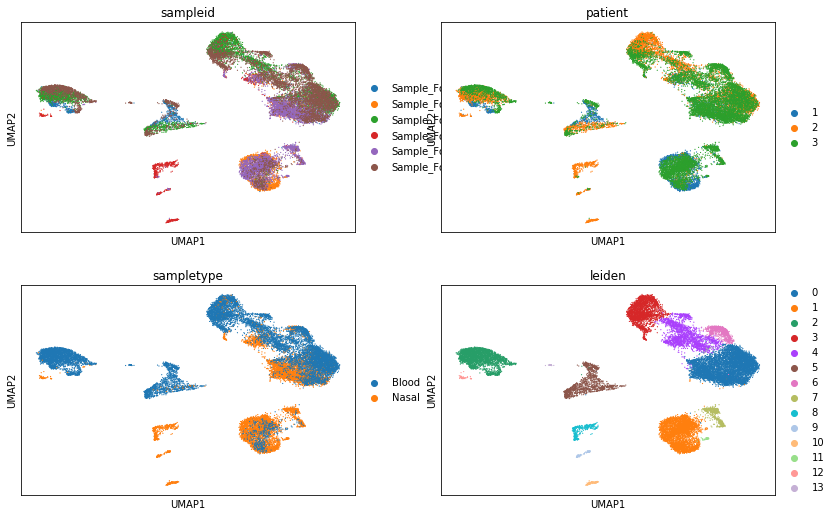

In [115]:
# find clusters
sc.tl.leiden(adata2, resolution = 0.5)
sc.pl.umap(adata2, color=['sampleid', 'patient', 'sampletype', 'leiden'], ncols = 2)

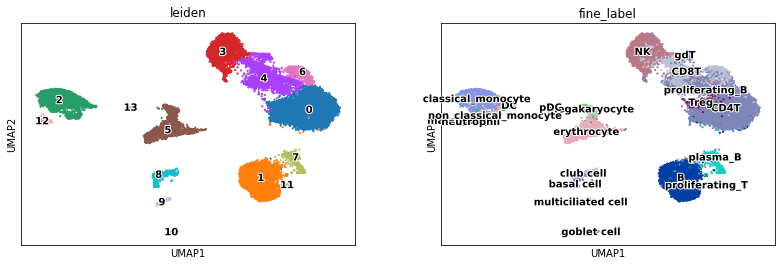

In [116]:
sc.pl.umap(adata2, color=['leiden', 'fine_label'], size = 20, legend_loc = 'on data', legend_fontoutline=2)

### Clean up the subcluster annotations

### Lymphoid

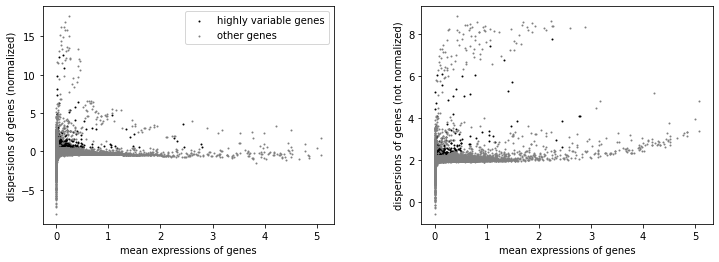

AnnData object with n_obs × n_vars = 16007 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors', 'fine_label_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [117]:
# subset
rna_ = adata2[adata2.obs['leiden'].isin(['0','3','4','6', '1', '7', '11'])]
rna_x = sc.AnnData(X = rna_.raw.X, obs = rna_.obs, var = rna_.raw.var, uns = rna_.uns, obsm = rna_.obsm, obsp = rna_.obsp)
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rna_x.var.index:
    if re.search('^TR[AB]V|^IG[HKL]V', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)
rna_x

In [118]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

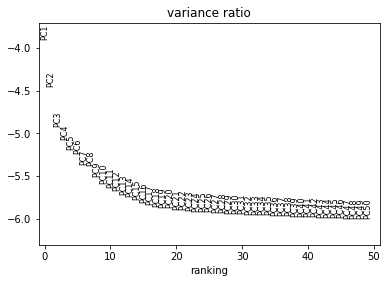

In [119]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

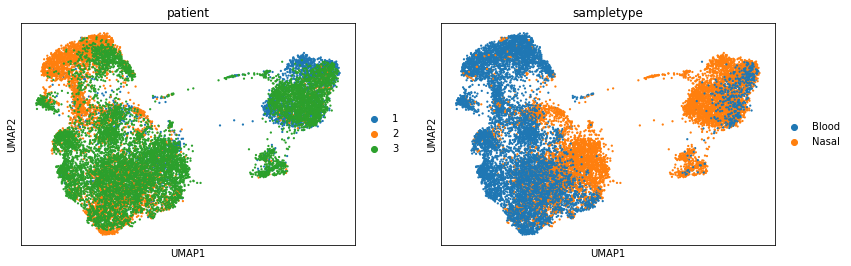

In [120]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['patient', 'sampletype'], size=20)

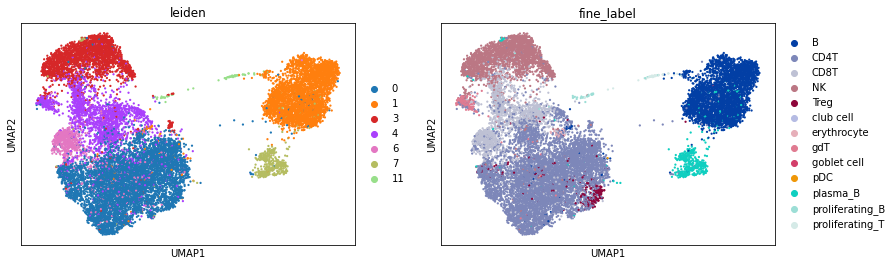

In [121]:
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=20)

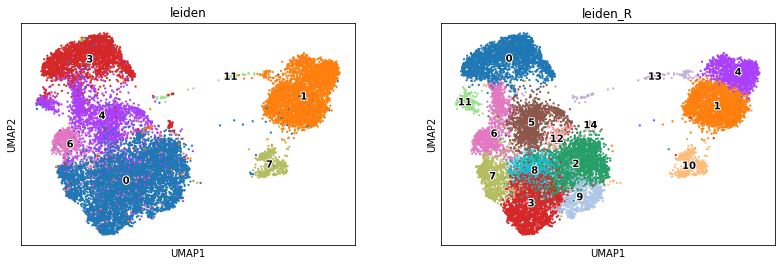

In [122]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=20, legend_loc ='on data', legend_fontoutline=2)

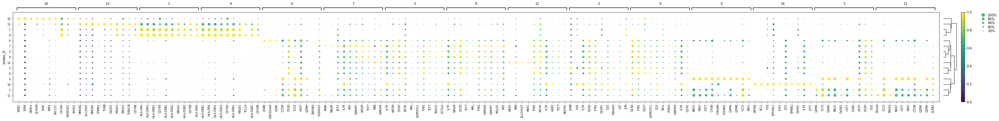

In [123]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

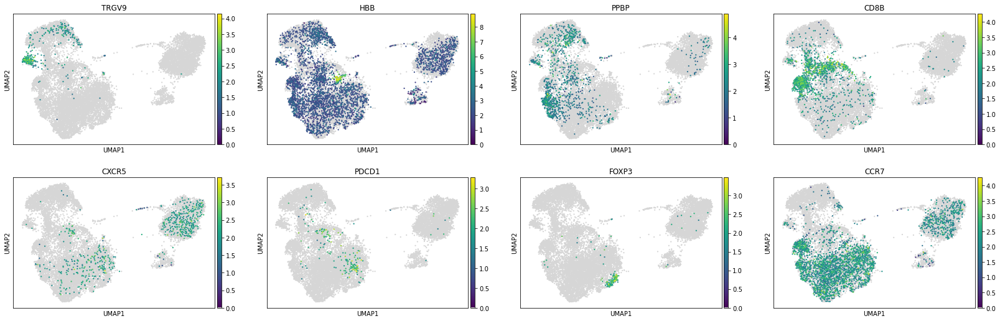

In [124]:
sc.pl.umap(rna_x, color=['TRGV9', 'HBB', 'PPBP', 'CD8B', 'CXCR5', 'PDCD1', 'FOXP3', 'CCR7'], size=20, legend_loc ='on data', legend_fontoutline=2, color_map = newcmp)

... storing 'fine_label' as categorical


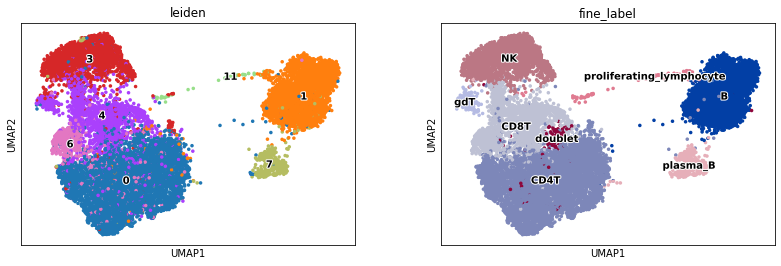

In [125]:
new_dict1 = {'0':'NK',
'1':'B',
'2':'CD4T',
'3':'CD4T',
'4':'B',
'5':'CD8T',
'6':'CD8T',
'7':'CD4T',
'8':'CD4T',
'9':'CD4T',
'10':'plasma_B',
'11':'gdT',
'12':'doublet',
'13':'proliferating_lymphocyte',
'14':'CD4T'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical


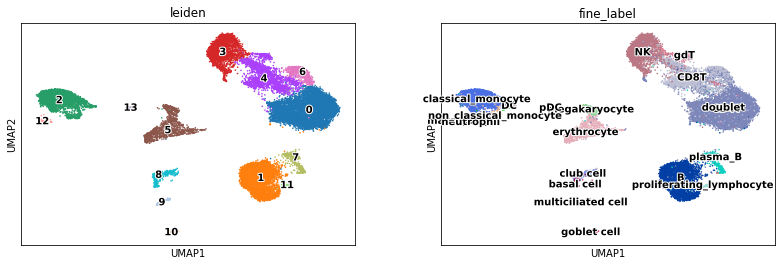

In [126]:
# update the original object
adata2.obs['fine_label'] = adata2.obs['fine_label'].astype('object')
adata2.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata2, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### Myeloid

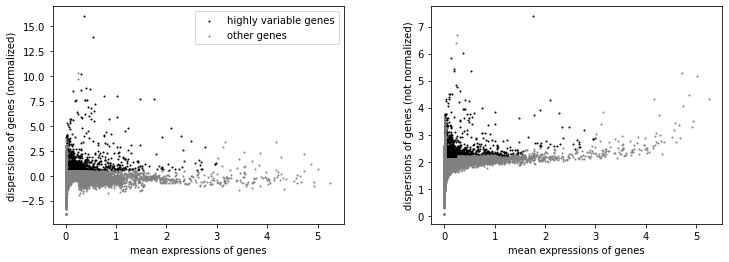

AnnData object with n_obs × n_vars = 2821 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [127]:
# subset
rna_ = adata2[adata2.obs['leiden'].isin(['2','12', '13'])]
rna_x = sc.AnnData(X = rna_.raw.X, obs = rna_.obs, var = rna_.raw.var, uns = rna_.uns, obsm = rna_.obsm, obsp = rna_.obsp)
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rna_x.var.index:
    if re.search('^TR[AB]V|^IG[HKL]V', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)
rna_x

In [128]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

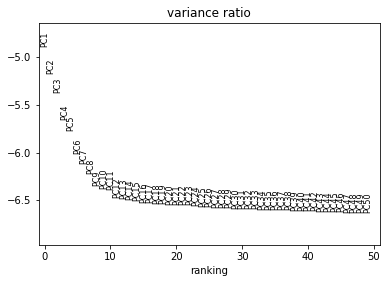

In [129]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

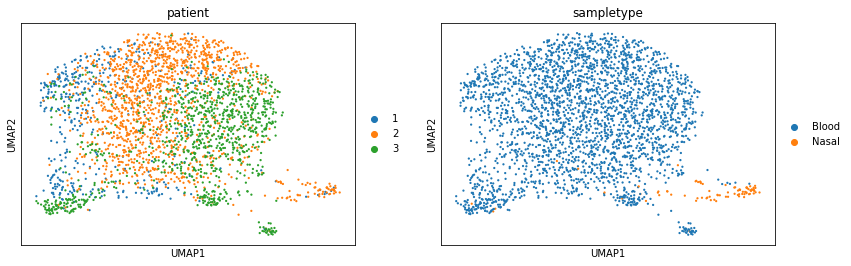

In [130]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['patient', 'sampletype'], size=20)

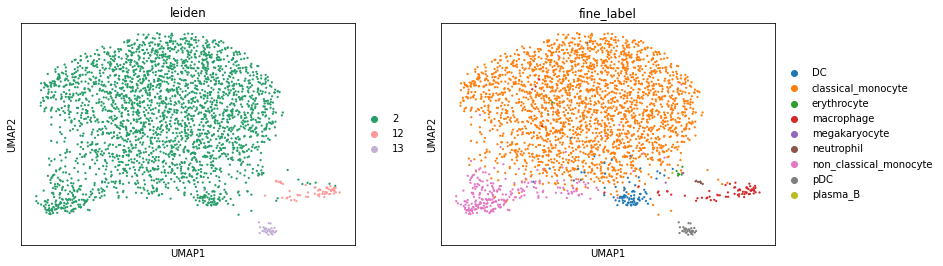

In [131]:
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=20)

... storing 'fine_label' as categorical


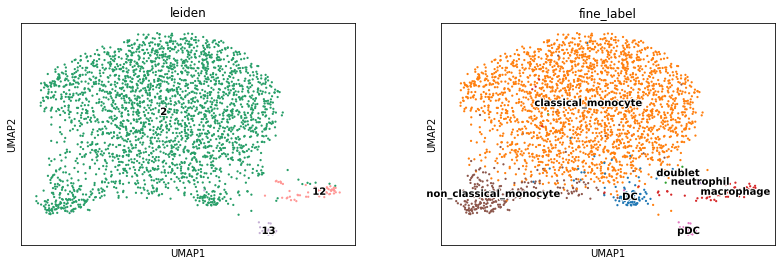

In [132]:
# just manually remove cells that were annotated as other celltypes 
rna_x.obs['fine_label'] = rna_x.obs['fine_label'].astype('object')
rna_x.obs['fine_label'][~rna_x.obs['fine_label'].isin(['non_classical_monocyte', 'classical_monocyte', 'DC', 'macrophage', 'neutrophil', 'pDC'])] = 'doublet'
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=20, legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical


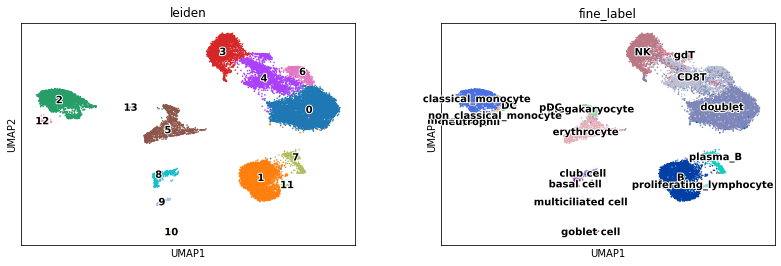

In [133]:
# update the original object
adata2.obs['fine_label'] = adata2.obs['fine_label'].astype('object')
adata2.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata2, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### Epithelial

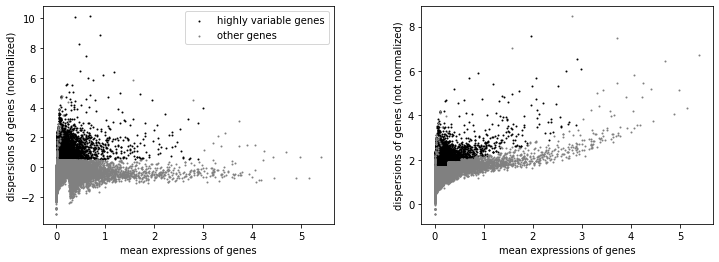

AnnData object with n_obs × n_vars = 599 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [134]:
# subset
rna_ = adata2[adata2.obs['leiden'].isin(['8', '9', '10'])]
rna_x = sc.AnnData(X = rna_.raw.X, obs = rna_.obs, var = rna_.raw.var, uns = rna_.uns, obsm = rna_.obsm, obsp = rna_.obsp)
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rna_x.var.index:
    if re.search('^TR[AB]V|^IG[HKL]V', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)
rna_x

In [135]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

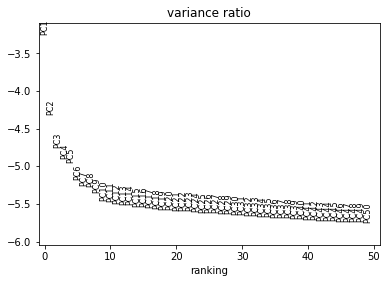

In [136]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

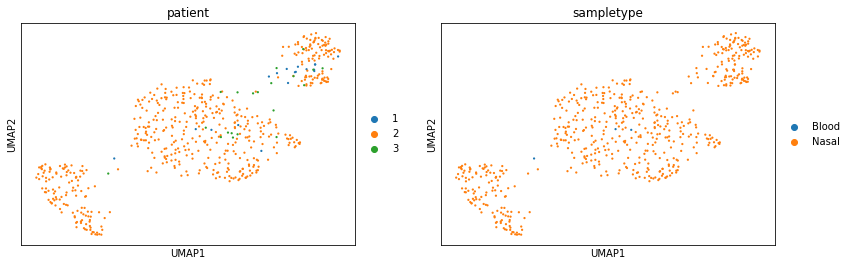

In [137]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['patient', 'sampletype'], size=20)

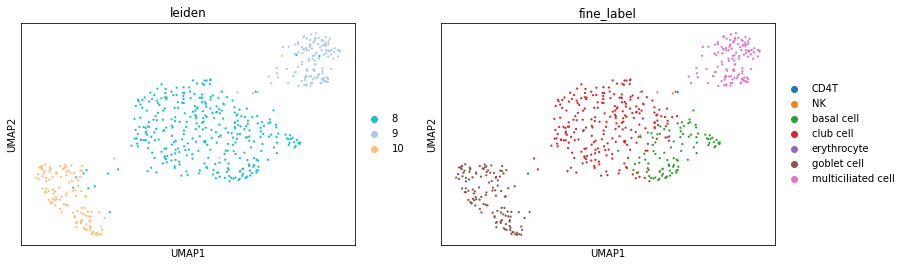

In [138]:
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=20)

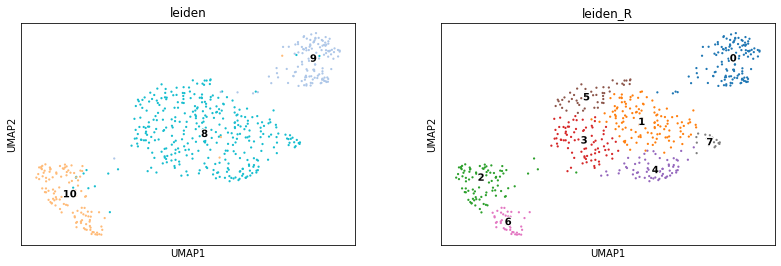

In [139]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R', resolution = 0.7)
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=20, legend_loc ='on data', legend_fontoutline=2)

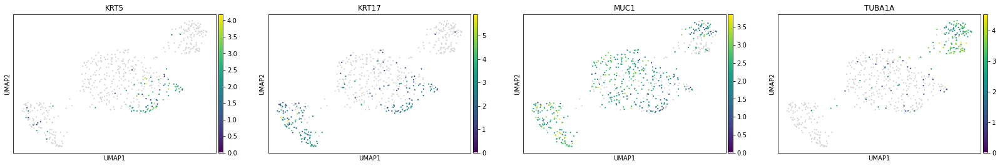

In [140]:
sc.pl.umap(rna_x, color=['KRT5', 'KRT17', 'MUC1', 'TUBA1A'], size=20, color_map = newcmp)

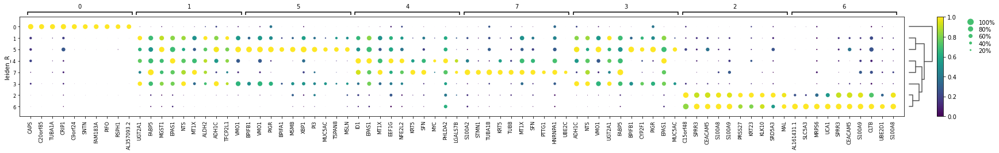

In [141]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'fine_label' as categorical


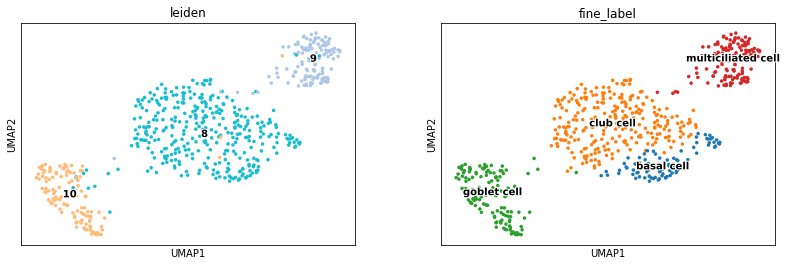

In [142]:
new_dict1 = {'0':'multiciliated cell',
'1':'club cell',
'2':'goblet cell',
'3':'club cell',
'4':'basal cell',
'5':'club cell',
'6':'goblet cell',
'7':'basal cell'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical


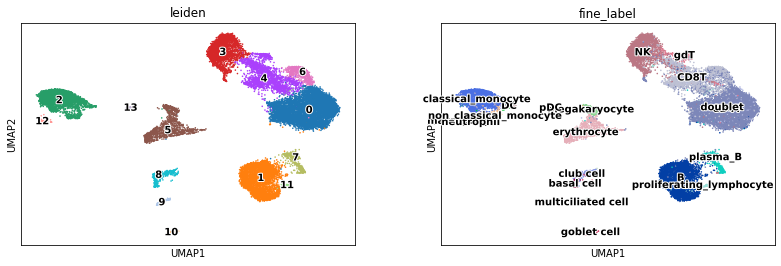

In [143]:
# update the original object
adata2.obs['fine_label'] = adata2.obs['fine_label'].astype('object')
adata2.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata2, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### Other

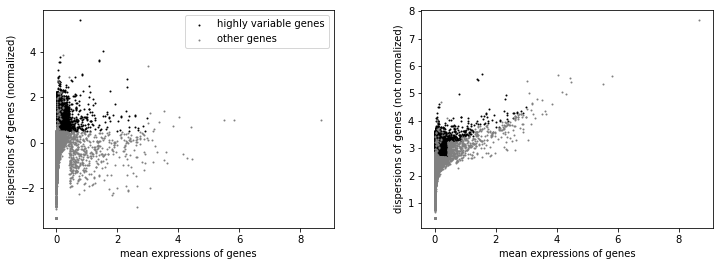

AnnData object with n_obs × n_vars = 1305 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [144]:
# subset
rna_ = adata2[adata2.obs['leiden'].isin(['5'])]
rna_x = sc.AnnData(X = rna_.raw.X, obs = rna_.obs, var = rna_.raw.var, uns = rna_.uns, obsm = rna_.obsm, obsp = rna_.obsp)
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rna_x.var.index:
    if re.search('^TR[AB]V|^IG[HKL]V', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)
rna_x

In [145]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

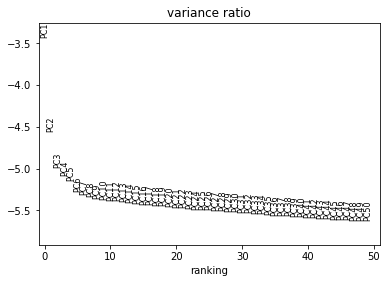

In [146]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

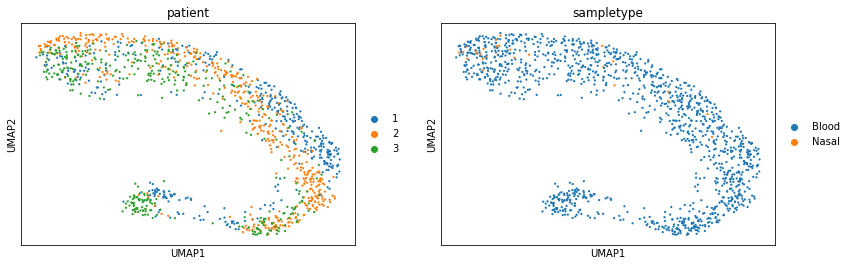

In [147]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['patient', 'sampletype'], size=20)

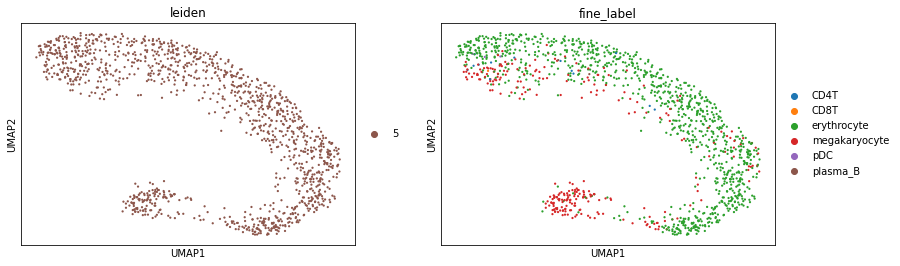

In [148]:
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=20)

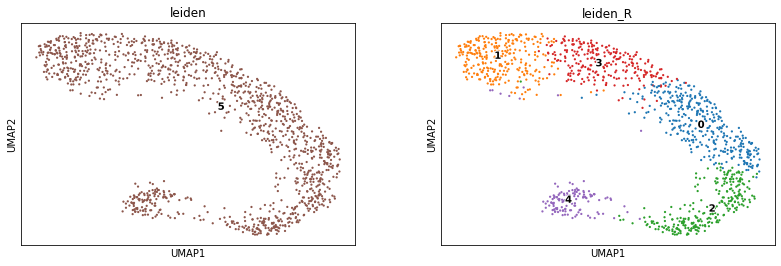

In [149]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R', resolution = 0.7)
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=20, legend_loc ='on data', legend_fontoutline=2)

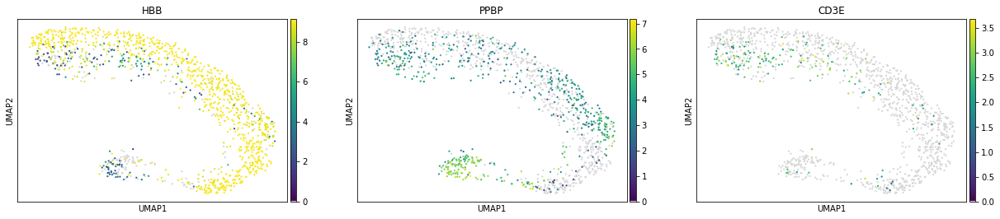

In [150]:
sc.pl.umap(rna_x, color=['HBB', 'PPBP', 'CD3E'], size=20, color_map = newcmp)

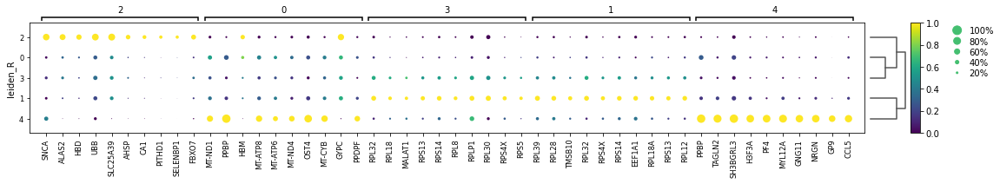

In [151]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'fine_label' as categorical


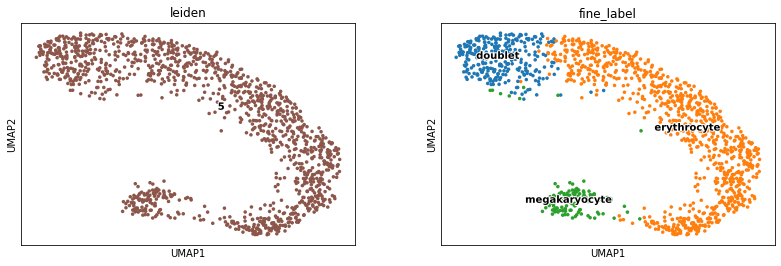

In [152]:
new_dict1 = {'0':'erythrocyte',
'1':'doublet',
'2':'erythrocyte',
'3':'erythrocyte',
'4':'megakaryocyte'}
rna_x.obs['fine_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'fine_label'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical


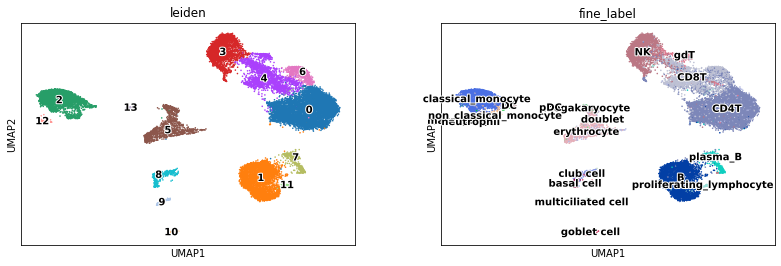

In [153]:
# update the original object
adata2.obs['fine_label'] = adata2.obs['fine_label'].astype('object')
adata2.obs['fine_label'].update(rna_x.obs['fine_label'].astype('object'))
sc.pl.umap(adata2, color = ['leiden', 'fine_label'], size = 10, legend_loc = 'on data', legend_fontoutline=2)

### Remove remnant doublets

In [154]:
adata.obs = adata2.obs.copy()
adata_raw.obs = adata2.obs.copy()
# remove doublets
adata = adata[~(adata.obs['fine_label'] == 'doublet')]
adata_raw = adata_raw[~(adata_raw.obs['fine_label'] == 'doublet')]
adata

View of AnnData object with n_obs × n_vars = 20248 × 1143
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'rank_genes_groups', 'rank_genes_groups_filtered', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [155]:
# recluster
adata2 = sc.AnnData(X = adata.raw.X, var = adata.raw.var, obs = adata.obs, raw = adata.raw)
adata2

AnnData object with n_obs × n_vars = 20248 × 19014
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'

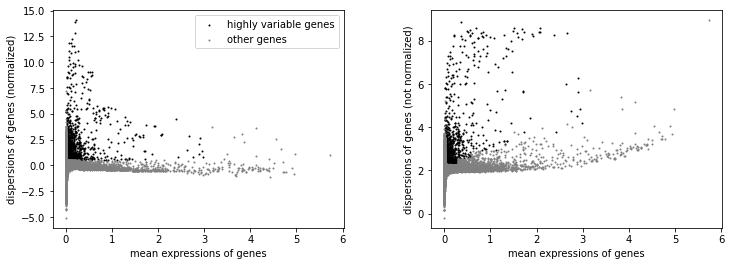

In [156]:
# Identify highly-variable genes
sc.pp.highly_variable_genes(adata2, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# plot highly_variable_genes
sc.pl.highly_variable_genes(adata2)

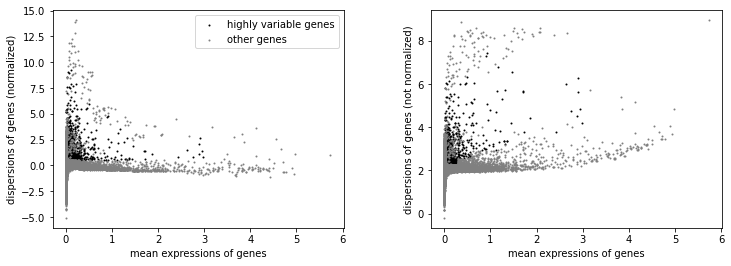

In [157]:
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in adata2.var.index:
    if re.search('^TR[AB]V|^IG[HKL]V', i):
        adata2.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata2)

In [158]:
# filter to only highly variable
adata2 = adata2[:, adata2.var['highly_variable']]
adata2

View of AnnData object with n_obs × n_vars = 20248 × 1187
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'

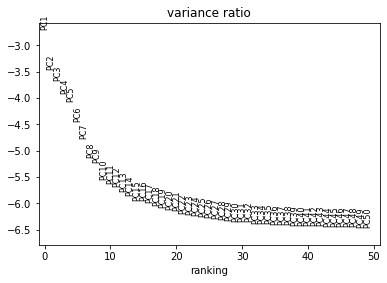

In [159]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(adata2, ['n_counts', 'percent_mito'], n_jobs = multiprocessing.cpu_count()-4)
sc.pp.scale(adata2, max_value = 10)
# Principal component analysis
sc.tl.pca(adata2, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata2, log = True, n_pcs = 50)

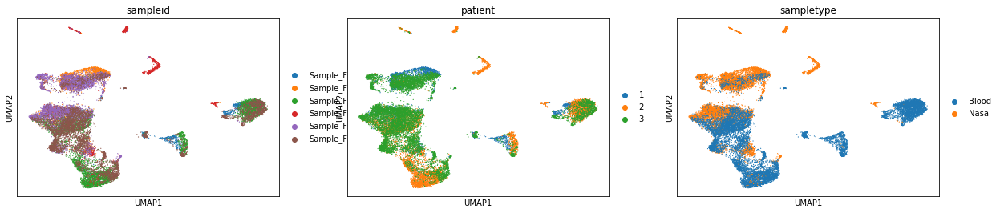

In [160]:
# run BBKNN
sc.external.pp.bbknn(adata2, batch_key = 'patient', neighbors_within_batch=10)
# UMAP
sc.tl.umap(adata2, n_components = 2, min_dist = 0.3)
sc.pl.umap(adata2, color=['sampleid', 'patient', 'sampletype'])

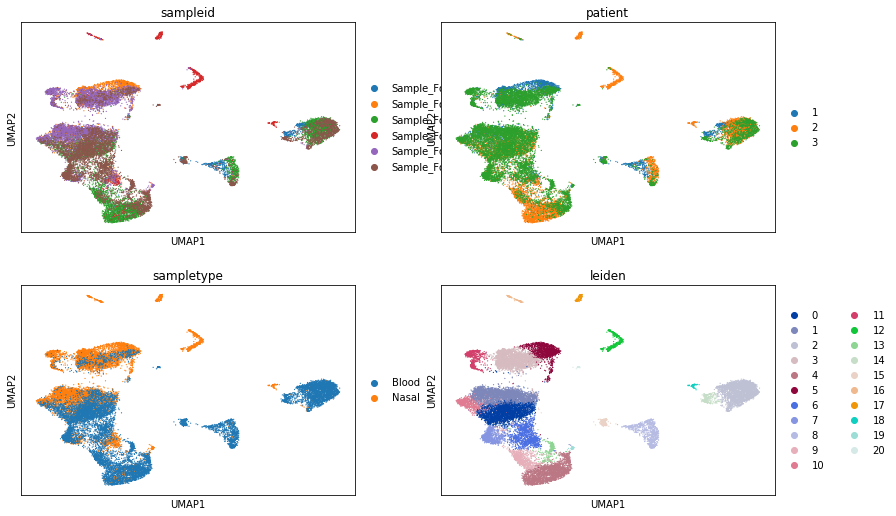

In [161]:
# find clusters
sc.tl.leiden(adata2)
sc.pl.umap(adata2, color=['sampleid', 'patient', 'sampletype', 'leiden'], ncols = 2)

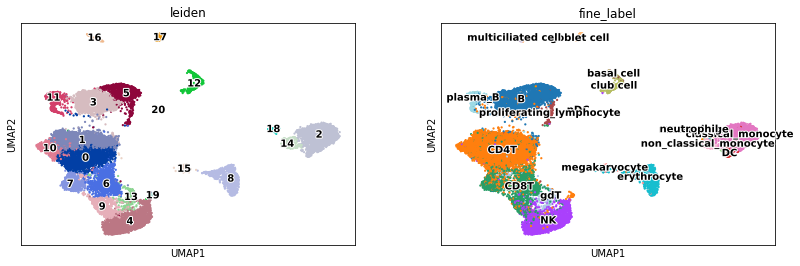

In [162]:
sc.pl.umap(adata2, color=['leiden', 'fine_label'], size = 20, legend_loc = 'on data', legend_fontoutline=2)

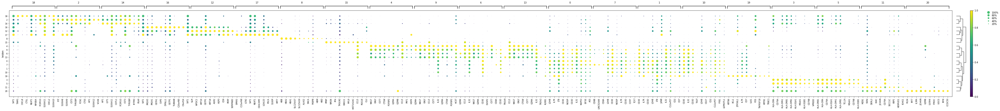

In [163]:
sc.tl.rank_genes_groups(adata2, groupby = 'leiden', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(adata2, min_fold_change=1)
sc.tl.dendrogram(adata2, groupby = 'leiden')
sc.pl.rank_genes_groups_dotplot(adata2, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'broad_label' as categorical


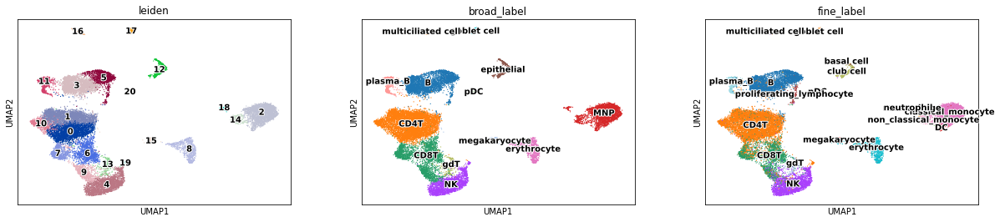

In [165]:
# give broad annoations
new_dict = {'0':'CD4T',
'1':'CD4T',
'2':'MNP',
'3':'B',
'4':'NK',
'5':'B',
'6':'CD8T',
'7':'CD8T',
'8':'erythrocyte',
'9':'CD8T',
'10':'CD4T',
'11':'plasma_B',
'12':'epithelial',
'13':'gdT',
'14':'MNP',
'15':'megakaryocyte',
'16':'multiciliated cell',
'17':'goblet cell',
'18':'MNP',
'19':'NK',
'20':'pDC'}
adata2.obs['broad_label'] = [new_dict[l] for l in adata2.obs['leiden']]
sc.pl.umap(adata2, color=['leiden', 'broad_label', 'fine_label'], legend_fontoutline=2, legend_loc = 'on data')

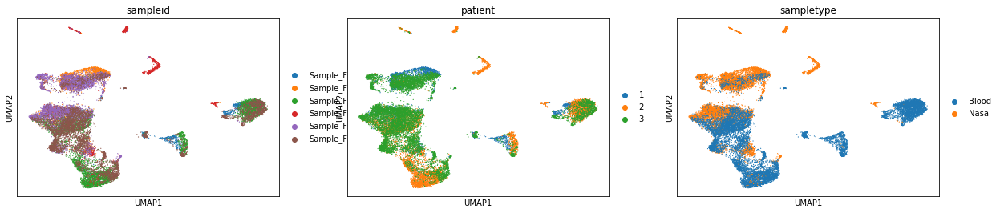

In [166]:
sc.pl.umap(adata2, color=['sampleid', 'patient', 'sampletype'])

In [167]:
# transfer and save!
adata.obs = adata2.obs.copy()
adata_raw.obs = adata2.obs.copy()
adata.obsm.update(adata2.obsm)
adata_raw.obsm.update(adata2.obsm)
adata.obsp = adata2.obsp.copy()
adata_raw.obsp = adata2.obsp.copy()
adata.write('out/adata_covid.h5ad', compression = 'gzip')
adata_raw.write('out/adata_covid_raw.h5ad', compression = 'gzip')

... storing 'feature_types' as categorical
... storing 'genome' as categorical


In [168]:
adata

AnnData object with n_obs × n_vars = 20248 × 1143
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'patient_colors', 'sampletype_colors', 'leiden', 'rank_genes_groups', 'rank_genes_groups_filtered', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [169]:
# check how many cells
pd.crosstab(adata.obs['sampletype'], adata.obs['patient'])

patient,1,2,3
sampletype,,,
Blood,897,5920,5697
Nasal,2256,938,4540
